exp003

dataloaderのget_img_gridでローパスフィルタ

In [1]:
import gc
import os
import random
import time
import math

import cv2
import numpy as np
import matplotlib.pyplot as plt

# model
import torch
import torchvision
import torch.nn as nn
import timm
from torchvision.models.feature_extraction import create_feature_extractor
import torchvision.transforms.functional as TF

# data loader
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import DataLoader, Dataset

# training
from torch.optim import SGD, Adam, AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR, CosineAnnealingWarmRestarts, ReduceLROnPlateau

# metric
from sklearn.metrics import fbeta_score, roc_auc_score

import wandb

# config

In [2]:
BASE_DIR = "/working/"
INPUT_DIR = os.path.join(BASE_DIR, "input", "vesuvius-challenge-ink-detection")
TRAIN_DIR = os.path.join(INPUT_DIR, "train")
TEST_DIR = os.path.join(INPUT_DIR, "test")
OUTPUT_DIR = os.path.join(BASE_DIR, "output", "exp006")

SURFACE_LIST = [
                range(26, 36, 3),
                range(27, 37, 3),                
                range(25, 35, 3),
                ]
print(len(SURFACE_LIST[0]))
print(SURFACE_LIST)

SURFACE_NUM = len(SURFACE_LIST[0])
# print("Start surface idx =",START_SURFACE)


CFG = {
    "DEBUG" : False,
    # exp setting
    "EXP_CATEGORY" : "makebase",
    "EXP_NAME" : "exp006",
    "folds" : [0, 1, 2],

    # model
    # "model_name" : "tf_efficientnet_b0",
    "model_name" : "tf_efficientnet_b6",
    "inp_channels" : SURFACE_NUM,
    "out_channels" : 1,
    "pretrained" : True,
    "out_indices" : [0,1,2,3,4],
 
    # data   
    "img_size": [256, 256],
    # "batch_size": 64,
    "batch_size": 16,#batch normの関係か？16の方が64より安定してそう？？
    "INPUT_DIR": INPUT_DIR,
    "TRAIN_DIR": TRAIN_DIR,
    "TEST_DIR": TEST_DIR,
    "OUTPUT_DIR": OUTPUT_DIR,
    "surface_num": SURFACE_NUM,
#     "surface_start_idx": START_SURFACE,
    "TRAIN_DIR_LIST": [["1", "2"], ["1", "3"], ["2", "3"]],
#     "TRAIN_IDX_LIST" : ["1"],
    "VALID_DIR_LIST": [["3"],["2"],["1"]],
    "TEST_DIR_LIST": ["a", "b"],

    # learning
    "n_epoch" : 15,
    "lr" : 7.5e-4,
    "T_max" : 10,
    "min_lr" : 1e-8,
    "weight_decay" : 1e-6,

    # etc
    "print_freq" : 1000,
    "random_seed" : 21,
    "num_workers": 2,
}

if CFG["model_name"]=="tf_efficientnet_b0":
    CFG["channel_nums"] = [320, 112, 40, 24, 16]
elif CFG["model_name"]=="tf_efficientnet_b4":
    CFG["channel_nums"] = [448, 160, 56, 32, 24]
elif CFG["model_name"]=="tf_efficientnet_b6":
    CFG["channel_nums"] = [576, 200, 72, 40, 32]


if CFG["DEBUG"]:
    CFG["n_epoch"] = 2
    CFG["EXP_NAME"] = "DEBUG"

4
[range(26, 36, 3), range(27, 37, 3), range(25, 35, 3)]


# utils

In [3]:
def seed_everything(seed=CFG["random_seed"]):
    #os.environ['PYTHONSEED'] = str(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic =True
    torch.backends.cudnn.benchmark = False
seed_everything()

# device optimization
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')
print(f'Using device: {device}')

Using device: cuda


In [4]:
def asMinutes(s):
    """Convert Seconds to Minutes."""
    m = math.floor(s / 60)
    s -= m * 60
    return '%dm %ds' % (m, s)

def timeSince(since, percent):
    """Accessing and Converting Time Data."""
    now = time.time()
    s = now - since
    es = s / (percent)
    rs = es - s
    return '%s (remain %s)' % (asMinutes(s), asMinutes(rs))

class AverageMeter(object):
    """Computes and stores the average and current value."""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

# metric

In [5]:
def fbeta_numpy(targets, preds, beta=0.5, smooth=1e-5):
    y_true_count = targets.sum()
    ctp = preds[targets==1].sum()
    cfp = preds[targets==0].sum()
    beta_squared = beta * beta

    c_precision = ctp / (ctp + cfp + smooth)
    c_recall = ctp / (y_true_count + smooth)
    dice = (1 + beta_squared) * (c_precision * c_recall) / (beta_squared * c_precision + c_recall + smooth)

    return dice

def calc_fbeta_auc(mask, mask_pred):
    mask = mask.astype(int).flatten()
    mask_pred = mask_pred.flatten()

    best_th = 0
    best_dice = 0
    
    # for th in np.array(range(10, 50+1, 5)) / 100:
    for th in np.array(range(10, 100+1, 5)) / 100:
        
        # dice = fbeta_score(mask, (mask_pred >= th).astype(int), beta=0.5)
        dice = fbeta_numpy(mask, (mask_pred >= th).astype(int), beta=0.5)
        print(f'\t th: {th}, fbeta: {dice}')
        

        if dice > best_dice:
            best_dice = dice
            best_th = th
    
    auc = roc_auc_score(mask, mask_pred)
    # Logger.info(f'best_th: {best_th}, fbeta: {best_dice}')
    return best_dice, best_th, auc


def calc_cv(mask_gt, mask_pred):
    best_dice, best_th, auc = calc_fbeta_auc(mask_gt, mask_pred)

    return best_dice, best_th, auc

# model

In [6]:
class Encoder(nn.Module):
    def __init__(self, CFG):
        super().__init__()
        self.encoder = timm.create_model(CFG["model_name"], in_chans=CFG["inp_channels"], features_only=True, out_indices=CFG["out_indices"], pretrained=CFG["pretrained"])
    def forward(self, img):
        skip_connection_list = self.encoder(img)
        return skip_connection_list

class UpConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.bn1 = nn.BatchNorm2d(in_channels)
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size = 2, padding="same")
        self.bn2 = nn.BatchNorm2d(out_channels)

    def forward(self, x):
        x = self.up(x)
        x = self.bn1(x)
        x = self.conv(x)
        x = self.bn2(x)
        return x


class Decoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.UpConv_0 = UpConv(CFG["channel_nums"][0], CFG["channel_nums"][1])
        self.UpConv_1 = UpConv(CFG["channel_nums"][1]*2, CFG["channel_nums"][2])
        self.UpConv_2 = UpConv(CFG["channel_nums"][2]*2, CFG["channel_nums"][3])
        self.UpConv_3 = UpConv(CFG["channel_nums"][3]*2, CFG["channel_nums"][4])
        self.UpConv_4 = UpConv(CFG["channel_nums"][4]*2, CFG["channel_nums"][4])
    
    def forward(self, skip_connection_list):
        emb = self.UpConv_0(skip_connection_list[4]) # emb.shape = (None, 160, 14, 14)
        emb_cat = torch.cat([skip_connection_list[3], emb], dim = 1)
        
        emb = self.UpConv_1(emb_cat)
        emb_cat = torch.cat([skip_connection_list[2], emb], dim = 1)
        
        emb = self.UpConv_2(emb_cat)
        emb_cat = torch.cat([skip_connection_list[1], emb], dim = 1)
        
        emb = self.UpConv_3(emb_cat)
        emb_cat = torch.cat([skip_connection_list[0], emb], dim = 1)

        emb_cat = self.UpConv_4(emb_cat)
        
        return emb_cat

class SegModel(nn.Module):
    def __init__(self, CFG):
        super().__init__()
        self.encoder = Encoder(CFG)
        self.decoder = Decoder()
        self.head = nn.Sequential(
            nn.Conv2d(CFG["channel_nums"][-1], CFG["out_channels"], kernel_size=1, stride=1, padding=0),
            nn.Sigmoid()
        )
    def forward(self, img):
        skip_connection_list = self.encoder(img)
        emb = self.decoder(skip_connection_list)
        output = self.head(emb)
        return output

# Dataset

In [7]:
train_transforms = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.RandomCrop(int(CFG["img_size"][0]*0.8), int(CFG["img_size"][1]*0.8), p=0.3),
    A.Blur(blur_limit=3, p=0.3),
    A.Resize(CFG["img_size"][0], CFG["img_size"][1]),
    ToTensorV2(),
])

valid_transforms = A.Compose([
    ToTensorV2(),
])


In [8]:
def fft_transform(img):
    eps = 1e-7
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    fshift = np.nan_to_num(fshift)+eps#nanを0埋め
    magnitude_spectrum = 20*np.log(np.abs(fshift))
    return magnitude_spectrum

def highpass_filter(img):
    frange = 1
    dft = cv2.dft(np.float32(img),flags = cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)

    rows, cols = img.shape
    crow,ccol = rows//2 , cols//2

    # create a mask first, center square is 1, remaining all zeros
    mask = np.ones((rows,cols,2),np.uint8)
    mask[crow-frange:crow+frange, ccol-frange:ccol+frange] = 0

    # apply mask and inverse DFT
    fshift = dft_shift*mask
    f_ishift = np.fft.ifftshift(fshift)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:,:,0],img_back[:,:,1])

    return img_back

def lowpass_filter(img):
    frange = 5
    dft = cv2.dft(np.float32(img),flags = cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)

    rows, cols = img.shape
    crow,ccol = rows//2 , cols//2

    # create a mask first, center square is 1, remaining all zeros
    mask = np.zeros((rows,cols,2),np.uint8)
    mask[crow-frange:crow+frange, ccol-frange:ccol+frange] = 1

    # apply mask and inverse DFT
    fshift = dft_shift*mask
    f_ishift = np.fft.ifftshift(fshift)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:,:,0],img_back[:,:,1])

    return img_back

In [9]:
class VCID_Dataset(Dataset):
    def __init__(self, CFG, data_dir_list, surface_list, slide_pos=[0,0], mode="train", transform=None):
        # get config
        self.mode = mode
        self.img_size = CFG["img_size"]
        if self.mode=="train":  self.DATADIR = CFG["TRAIN_DIR"]
        elif self.mode=="valid":    self.DATADIR = CFG["TRAIN_DIR"]
        elif self.mode == "test":   self.DATADIR = CFG["TEST_DIR"]
        self.data_dir_list = data_dir_list
        self.surface_list = surface_list
        self.slide_pos = slide_pos
        self.transform = transform
        
        # get imgs
        print("initializing dataset...")
        self.imgs = []
        for data_dir in self.data_dir_list:
            img_path = os.path.join(self.DATADIR, data_dir, "mask.png")
            print(img_path)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            img = img.reshape(img.shape[0], img.shape[1], 1) # (h, w, channel=1)
            self.imgs.append(img)
        
        # check imgs
        for img in self.imgs:
            assert img is not None, "img is None. data path is wrong"
        # get and split surface
        self.surface_vols = self.read_surfacevols()
        for surface_vol in self.surface_vols:
            assert surface_vol is not None, "surface_vol is None. data path is wrong"
       
        # split grid
        self.get_all_grid()
        self.fileter_grid()
        self.get_flatten_grid()
        print("split grid done.") 
       
        # get label imgs
        if self.mode == "train" or self.mode == "valid":
            self.labels = []
            for data_dir in self.data_dir_list:
                label_path = os.path.join(self.DATADIR, data_dir, "inklabels.png")
                assert os.path.exists(label_path), f"{label_path} is not exist."
                
                # read label
                label = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
                label = label.reshape(label.shape[0], label.shape[1], 1) # (h, w, channel=1)
                self.labels.append(label)# 画像サイズがそれぞれ違うので単純にconcatできずlist化しているs
        print("initializing dataset done.")

    def read_surfacevols(self):
        """ read surface volume by data_dir_list and surface_list 
            Returns:surface_vuls (list): surface volume list [array(h,w,channel=surface_num), array(), ...]
        """
        surface_vols = []
        print("reading surface volume...")
        for data_dir in self.data_dir_list:
            surface_vol_ = None
            for read_idx, surface_idx in enumerate(self.surface_list):
                print("\r", f"reading idx : {read_idx+1}/{len(self.surface_list)}", end="")
                surface_path = os.path.join(self.DATADIR, data_dir, "surface_volume", f"{surface_idx:02}.tif")
                surface_vol = cv2.imread(surface_path, cv2.IMREAD_GRAYSCALE)
                surface_vol = surface_vol.reshape(surface_vol.shape[0], surface_vol.shape[1], 1) # (h, w, channel=1)
                if surface_vol_ is None:
                    surface_vol_ = surface_vol
                else:
                    surface_vol_ = np.concatenate([surface_vol_, surface_vol], axis=2) # (h, w, channel=surface_num)
            surface_vols.append(surface_vol_)
            print(f"  => read surface volume done. [{data_dir}]")
        return surface_vols


    def get_grid_img(self, img, grid_idx):
        """ crop grid img from original img"""
        img_grid = img[grid_idx[0]*self.img_size[0] + self.slide_pos[0] : (grid_idx[0]+1)*self.img_size[0] + self.slide_pos[0],
                        grid_idx[1]*self.img_size[1] + self.slide_pos[1] : (grid_idx[1]+1)*self.img_size[1] + self.slide_pos[1]]
        return img_grid

    def get_grid_hpfimg(self, img, grid_idx):
        """ crop grid img from original img and hpf filter """
        img_grid = self.get_grid_img(img, grid_idx)
        img_transformed = None
        for channel in range(img_grid.shape[2]):
            img_grid_trans = highpass_filter(img_grid[:,:,channel])
            if img_transformed is None:
                img_transformed = img_grid_trans.reshape(img_grid_trans.shape[0], img_grid_trans.shape[1], 1)
            else:
                img_transformed = np.concatenate([img_transformed, img_grid_trans.reshape(img_grid_trans.shape[0], img_grid_trans.shape[1], 1)], axis=2)
        return img_transformed
    
    def get_all_grid(self):
        """ get all grid indices by img size and grid size
        """
        self.grid_indices = []
        for img in self.imgs:
            self.x_grid_size = (img.shape[0] - self.slide_pos[0]) // self.img_size[0]
            self.y_grid_size = (img.shape[1] - self.slide_pos[1]) // self.img_size[1]
            grid_img = []
            for i in range(self.x_grid_size):
                for j in range(self.y_grid_size):
                    grid_img.append([i, j])
            self.grid_indices.append(grid_img)
        return self.grid_indices
          
    def fileter_grid(self):
        """ get grid indices which mask is not 0 by all grid indices"""
        grid_indices_all = []
        for img, grid_indices in zip(self.imgs, self.grid_indices):
            grid_indices_copy = grid_indices.copy()
            for grid_idx in grid_indices:
                img_grid = self.get_grid_img(img, grid_idx)
                if img_grid.sum() == 0:
                    grid_indices_copy.remove(grid_idx)
            grid_indices_all.append(grid_indices_copy)
        self.grid_indices = grid_indices_all
        return self.grid_indices

    def get_flatten_grid(self):
        """ get flatten index list by grid indices
            Returns:flatten_grid (list): flatten index list [[img_idx, grid_idx], [img_idx, grid_idx], ...]
        """
        flatten_grid = []
        for img_idx, grid_indices in enumerate(self.grid_indices):
            for grid_idx in grid_indices:
                grid_imgidx_list = [img_idx]
                grid_imgidx_list.extend(grid_idx)
                flatten_grid.append(grid_imgidx_list)
        self.flatten_grid = flatten_grid
        return self.flatten_grid

    def __len__(self):
        return len(self.flatten_grid)

    def __getitem__(self, idx):
        # get indices
        img_grid_idx = self.flatten_grid[idx]
        img_idx = img_grid_idx[0]
        grid_idx = img_grid_idx[1:]
        # get img & surface_vol
        img = self.imgs[img_idx]
        surface_vol = self.surface_vols[img_idx]
        img = self.get_grid_img(img, grid_idx)/255.
        surface_vol = self.get_grid_img(surface_vol, grid_idx)/255.
        assert surface_vol.shape[0]==img.shape[0] and surface_vol.shape[1]==img.shape[1] , "surface_vol_list shape is not same as img shape"
        img = surface_vol

        # transform
        if self.mode == "test":
            if self.transform:
                img = self.transform(image=img)["image"]
            else:
                img = img.transpose(2, 0, 1)
                img = torch.tensor(img, dtype=torch.float32)
            return img, grid_idx
        elif self.mode == "train" or self.mode=="valid":
            # get label(segmentation mask)
            label = self.labels[img_idx]
            label = self.get_grid_img(label, grid_idx)
            if self.transform:
                transformed = self.transform(image=img, mask=label)
                img = transformed["image"]
                label = transformed["mask"]
                label = label.permute(2, 0, 1)/255. # (channel, h, w)
                # label = TF.resize(img=label, size=(self.img_size[0]//2, self.img_size[1]//2))
            else:
                img = img.transpose(2, 0, 1) # (channel, h, w)
                label = label.transpose(2, 0, 1)/255. # (channel, h, w){}
                img = torch.tensor(img, dtype=torch.float32)
                label = torch.tensor(label, dtype=torch.float32)
                # label = TF.resize(img=label, size=(self.img_size[0]//2, self.img_size[1]//2))
            return img, label, grid_idx


dataset
initializing dataset...
/working/input/vesuvius-challenge-ink-detection/train/3/mask.png
reading surface volume...
 reading idx : 4/4  => read surface volume done. [3]
split grid done.
initializing dataset done.
dataloader


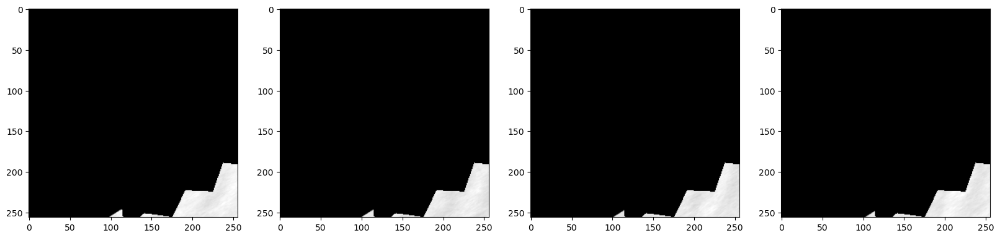

0.41960785
0.43137255
0.42352942
0.41960785


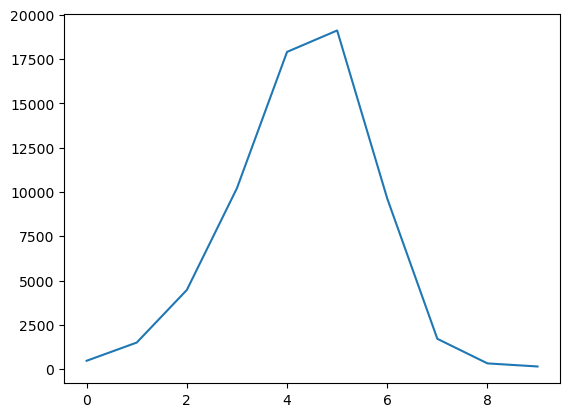

tensor([[0.4510, 0.4392, 0.4157,  ..., 0.5765, 0.5843, 0.5922],
        [0.5608, 0.5451, 0.5216,  ..., 0.5686, 0.5804, 0.5843],
        [0.6588, 0.6353, 0.6118,  ..., 0.5686, 0.5804, 0.5843],
        ...,
        [0.4784, 0.5333, 0.5686,  ..., 0.4627, 0.4745, 0.4863],
        [0.5373, 0.5922, 0.6588,  ..., 0.4667, 0.4667, 0.4863],
        [0.6039, 0.6510, 0.6745,  ..., 0.4784, 0.4784, 0.4863]])


In [10]:
valid_dirs = CFG["VALID_DIR_LIST"][0]
surface_list = SURFACE_LIST[0]
print("dataset")
dataset_notrans = VCID_Dataset(CFG, valid_dirs, surface_list, mode="train")
print("dataloader")
dataloader_notrans = DataLoader(dataset_notrans, 4, shuffle=False, num_workers=0)

imshow_batch = 10

for batch_idx, (imgs, labels, grid_idx) in enumerate(dataloader_notrans):
    img = imgs[0].permute(1, 2, 0)
    if batch_idx == 0:
        plt.figure(figsize=(20,5))
        for channel in range(img.shape[2]):
            plt.subplot(1, img.shape[2], channel+1)
            plt.imshow(img[:,:,channel], cmap="gray")
        plt.show()
        [print(np.max(img[:,:,idx].numpy())) for idx in range(img.shape[2])]
    if batch_idx >= imshow_batch:
        break    

img_hist, img_bins = np.histogram(np.array(img[:,:,0]).flatten())
plt.figure()
plt.plot(img_hist)
plt.show()
print(img[:,:,0])

dataset
initializing dataset...
/working/input/vesuvius-challenge-ink-detection/train/3/mask.png
reading surface volume...
 reading idx : 4/4  => read surface volume done. [3]
split grid done.
initializing dataset done.
dataloader


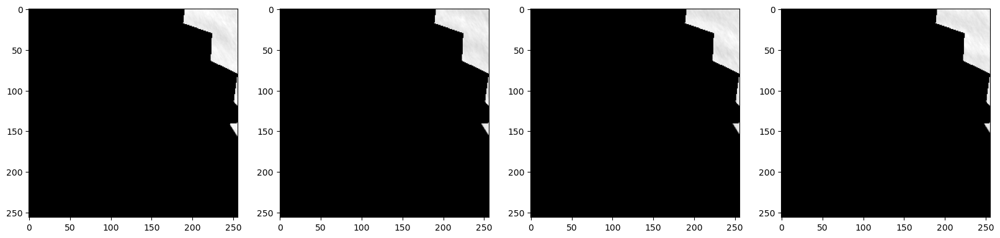

0.4196078431372549
0.43137254901960786
0.4235294117647059
0.4196078431372549


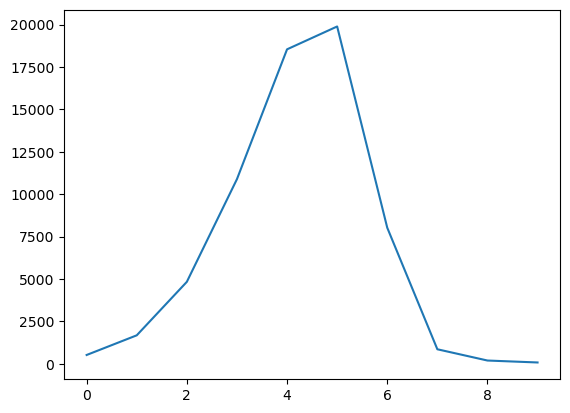

tensor([[0.4510, 0.4728, 0.4978,  ..., 0.4507, 0.4385, 0.4549],
        [0.4673, 0.4835, 0.5073,  ..., 0.4358, 0.4304, 0.4467],
        [0.4977, 0.5073, 0.5260,  ..., 0.4380, 0.4348, 0.4431],
        ...,
        [0.7023, 0.7022, 0.6826,  ..., 0.6628, 0.6779, 0.6902],
        [0.7180, 0.7119, 0.6777,  ..., 0.6590, 0.6777, 0.6938],
        [0.7098, 0.6962, 0.6748,  ..., 0.6590, 0.6801, 0.7020]],
       dtype=torch.float64)


In [11]:
valid_dirs = CFG["VALID_DIR_LIST"][0]
surface_list = SURFACE_LIST[0]
print("dataset")
dataset_notrans = VCID_Dataset(CFG, valid_dirs, surface_list, mode="train", transform=train_transforms)
print("dataloader")
dataloader_notrans = DataLoader(dataset_notrans, 4, shuffle=False, num_workers=0)


imshow_batch = 10

for batch_idx, (imgs, labels, grid_idx) in enumerate(dataloader_notrans):
    img = imgs[0].permute(1, 2, 0)
    if batch_idx == 0:
        plt.figure(figsize=(20,5))
        for channel in range(img.shape[2]):
            plt.subplot(1, img.shape[2], channel+1)
            plt.imshow(img[:,:,channel], cmap="gray")
        plt.show()
        [print(np.max(img[:,:,idx].numpy())) for idx in range(img.shape[2])]
    if batch_idx >= imshow_batch:
        break    

img_hist, img_bins = np.histogram(np.array(img[:,:,0]).flatten())
plt.figure()
plt.plot(img_hist)
plt.show()
print(img[:,:,0])

# train valid fn

In [12]:
def train_fn(train_loader, model, criterion, epoch ,optimizer, scheduler):
    model.train()
    batch_time = AverageMeter()
    losses = AverageMeter()
    start = end = time.time()
    for batch_idx, (images, targets, _) in enumerate(train_loader):
        images = images.to(device, non_blocking = True).float()
        targets = targets.to(device, non_blocking = True).float()     
        preds = model(images)
        
        # preds = torch.sigmoid(preds)
        loss = criterion(preds, targets)
        
        losses.update(loss.item(), CFG["batch_size"]) 
        targets = targets.detach().cpu().numpy().ravel().tolist()
        preds = preds.detach().cpu().numpy().ravel().tolist()
        loss.backward() # パラメータの勾配を計算
        optimizer.step() # モデル更新
        optimizer.zero_grad() # 勾配の初期化
                
        batch_time.update(time.time() - end)
        end = time.time()
        if batch_idx % CFG["print_freq"] == 0 or batch_idx == (len(train_loader)-1):
            print('Epoch: [{0}][{1}/{2}] '
                    'Elapsed {remain:s} '
                    'Loss: {loss.val:.4f}({loss.avg:.4f}) '
                    .format(
                        epoch, batch_idx, len(train_loader), batch_time=batch_time, loss=losses,
                        remain=timeSince(start, float(batch_idx+1)/len(train_loader)),
            ))
        del preds, images, targets
    gc.collect()
    torch.cuda.empty_cache()
    return losses.avg

In [13]:
def valid_fn(model, valid_loader, criterion):
    model.eval()# モデルを検証モードに設定
    test_targets = []
    test_preds = []
    test_grid_idx = []
    batch_time = AverageMeter()
    losses = AverageMeter()
    start = end = time.time()
    for batch_idx, (images, targets, grid_idx) in enumerate(valid_loader):
        images = images.to(device, non_blocking = True).float()
        targets = targets.to(device, non_blocking = True).float()
        with torch.no_grad():
            preds = model(images)
            loss = criterion(preds, targets)
        losses.update(loss.item(), CFG["batch_size"])
        batch_time.update(time.time() - end)

        targets = targets.detach().cpu().numpy()
        preds = preds.detach().cpu().numpy()
        
        test_preds.extend([preds[idx, :,:,:].transpose(1,2,0) for idx in range(preds.shape[0])])
        test_targets.extend([targets[idx, :,:,:].transpose(1,2,0) for idx in range(targets.shape[0])])
        test_grid_idx.extend([[x_idx, y_idx] for x_idx, y_idx in zip(grid_idx[0].tolist(), grid_idx[1].tolist())])

        if batch_idx % CFG["print_freq"] == 0 or batch_idx == (len(valid_loader)-1):
            print('EVAL: [{0}/{1}] '
                'Elapsed {remain:s} '
                'Loss: {loss.val:.4f}({loss.avg:.4f}) '
                .format(
                    batch_idx, len(valid_loader), batch_time=batch_time, loss=losses,
                    remain=timeSince(start, float(batch_idx+1)/len(valid_loader)),
                ))
        del preds, images, targets
        gc.collect()
        torch.cuda.empty_cache()

    return test_targets, test_preds, test_grid_idx, losses.avg

# training loop

In [14]:
def concat_grid_img(img_list, label_list, grid_idx_list, valid_dir_list):
    # concat pred img and label to original size
    img_path = os.path.join(CFG["TRAIN_DIR"], valid_dir_list[0], "mask.png")
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    img = img.reshape(img.shape[0], img.shape[1], 1)
    pred_img = np.zeros_like(img).astype(np.float32)
    label_img = np.zeros_like(img).astype(np.float32)
    for img_idx, grid_idx in enumerate(grid_idx_list):
        pred_img[grid_idx[0]*CFG["img_size"][0]:(grid_idx[0]+1)*CFG["img_size"][0],
                grid_idx[1]*CFG["img_size"][1]:(grid_idx[1]+1)*CFG["img_size"][1], :] += img_list[img_idx]
        
        label_img[grid_idx[0]*CFG["img_size"][0]:(grid_idx[0]+1)*CFG["img_size"][0],
                grid_idx[1]*CFG["img_size"][1]:(grid_idx[1]+1)*CFG["img_size"][1], :] += label_list[img_idx]
    return pred_img, label_img

In [15]:
def training_loop(CFG):
    best_score_list = []
    best_threshold_list = []
    best_epoch_list = []
    for fold in CFG["folds"]:
        print(f"-- fold{fold} training start --")
        
        # set model & learning fn
        model = SegModel(CFG)
        model = model.to(device)
        # if not CFG["DEBUG"]:
        #     wandb.watch(model)
        # criterion = nn.BCEWithLogitsLoss()
        valid_img_slice = []
        criterion = nn.BCELoss()
        optimizer = AdamW(model.parameters(), lr=CFG["lr"], weight_decay=CFG["weight_decay"], amsgrad=False)
        scheduler = CosineAnnealingLR(optimizer, T_max=CFG["T_max"], eta_min=CFG["min_lr"], last_epoch=-1)
        for slice_idx, surface_list in enumerate(SURFACE_LIST):
            print("surface_list: ", surface_list)
            # separate train/valid data 
            train_dirs = CFG["TRAIN_DIR_LIST"][fold]
            valid_dirs = CFG["VALID_DIR_LIST"][fold]
            train_dataset = VCID_Dataset(CFG, train_dirs, surface_list, mode="train", transform=train_transforms)
            valid_dataset = VCID_Dataset(CFG, valid_dirs, surface_list, mode="valid", transform=valid_transforms)
            train_loader = DataLoader(train_dataset, batch_size=CFG["batch_size"], shuffle = True,
                                        num_workers = CFG["num_workers"], pin_memory = True)
            valid_loader = DataLoader(valid_dataset, batch_size=CFG["batch_size"], shuffle = False,
                                        num_workers = CFG["num_workers"], pin_memory = True)

            # training
            best_score = -np.inf
            best_auc = -np.inf
            best_valloss = np.inf
            best_auc_valloss = np.inf
            best_threshold = -1
            start_time = time.time()
            best_epoch = -1
            best_auc_epoch = -1
            for epoch in range(1, CFG["n_epoch"] + 1):
                print(f'- epoch:{epoch} -')
                train_loss_avg = train_fn(train_loader, model, criterion, epoch ,optimizer, scheduler)
                valid_targets, valid_preds, valid_grid_idx, valid_loss_avg = valid_fn(model, valid_loader, criterion)
                
                # target, predをconcatして元のサイズに戻す
                valid_preds_img, valid_targets_img  = concat_grid_img(valid_preds, valid_targets, valid_grid_idx, valid_dirs)
                valid_score, valid_threshold, auc = calc_cv(valid_targets_img, valid_preds_img)
                valid_preds_binary = (valid_preds_img > valid_threshold).astype(np.uint8)
                
                elapsed = time.time() - start_time
                print(f"\t epoch:{epoch}, avg train loss:{train_loss_avg:.4f}, avg valid loss:{valid_loss_avg:.4f}")
                print(f"\t score:{valid_score:.4f}(th={valid_threshold:3f}), auc={auc:4f}::: time:{elapsed:.2f}s")
                scheduler.step()
                # validationスコアがbestを更新したらモデルを保存する
                if valid_score > best_score:
                    best_epoch = epoch
                    best_valloss = valid_loss_avg
                    best_score = valid_score
                    best_threshold = valid_threshold
                    model_name = CFG["model_name"]
                    model_path = os.path.join(CFG["OUTPUT_DIR"], f'{model_name}_fold{fold}.pth')
                    torch.save(model.state_dict(), model_path) 
                    print(f'Epoch {epoch} - Save Best Score: {best_score:.4f}. Model is saved.')
                    # save oof
                    cv2.imwrite(os.path.join(CFG["OUTPUT_DIR"], f"fold{fold}_slice{slice_idx}_valid_pred_img.png"), valid_preds_img*255)
                    cv2.imwrite(os.path.join(CFG["OUTPUT_DIR"], f"fold{fold}_slice{slice_idx}_valid_predbin_img.png"), valid_preds_binary*255)
                    cv2.imwrite(os.path.join(CFG["OUTPUT_DIR"], f"fold{fold}_slice{slice_idx}_valid_targets_img.png"), valid_targets_img*255)
                    
                    # plot preds & binary preds
                    plt.figure(dpi=100)
                    plt.subplot(1,3,1)
                    plt.imshow(valid_preds_img)
                    plt.subplot(1,3,2)
                    plt.imshow(valid_preds_binary)
                    plt.subplot(1,3,3)
                    plt.imshow(valid_targets_img)
                    plt.show()
                
                if auc > best_auc:
                    best_auc = auc
                    best_auc_epoch = epoch
                    best_auc_valloss = valid_loss_avg
                    model_name = CFG["model_name"]
                    model_path = os.path.join(CFG["OUTPUT_DIR"], f'{model_name}_auc_fold{fold}.pth')
                    torch.save(model.state_dict(), model_path) 
                    print(f'Epoch {epoch} - Save Best AUC: {best_auc:.4f}. Model is saved.')
                    # save oof
                    cv2.imwrite(os.path.join(CFG["OUTPUT_DIR"], f"fold{fold}auc_slice{slice_idx}_valid_pred_img.png"), valid_preds_img*255)
                    cv2.imwrite(os.path.join(CFG["OUTPUT_DIR"], f"fold{fold}auc_slice{slice_idx}_valid_predbin_img.png"), valid_preds_binary*255)
                    cv2.imwrite(os.path.join(CFG["OUTPUT_DIR"], f"fold{fold}auc_slice{slice_idx}_valid_targets_img.png"), valid_targets_img*255)
                    
                    # plot preds & binary preds
                    plt.figure(dpi=100)
                    plt.subplot(1,3,1)
                    plt.imshow(valid_preds_img)
                    plt.subplot(1,3,2)
                    plt.imshow(valid_preds_binary)
                    plt.subplot(1,3,3)
                    plt.imshow(valid_targets_img)
                    plt.show()
            valid_img_slice.append(valid_preds_img)
        valid_slice_ave = np.zeros((valid_preds_img.shape[0], valid_preds_img.shape[1], 1))
        for idx in CFG["folds"]:
            valid_pred_slice = valid_img_slice[idx]
            valid_slice_ave += valid_pred_slice
        valid_slice_ave /= len(CFG["folds"])
        valid_sliceave_score, valid_sliceave_threshold, ave_auc = calc_cv(valid_targets_img, valid_slice_ave)
        valid_slice_binary = (valid_slice_ave > valid_sliceave_threshold).astype(np.uint8)
        # plot preds & binary preds
        plt.figure(dpi=100)
        plt.subplot(1,3,1)
        plt.imshow(valid_slice_ave)
        plt.subplot(1,3,2)
        plt.imshow(valid_slice_binary)
        plt.subplot(1,3,3)
        plt.imshow(valid_targets_img)
        plt.show()
        print(f'[fold{fold}] slice ave score:{valid_sliceave_score:.4f}(th={valid_sliceave_threshold:3f}), auc={ave_auc:4f}')
        
        print(f'[fold{fold}] BEST Epoch {best_epoch} - Save Best Score:{best_score:.4f}. Best loss:{best_valloss:.4f}')
        print(f'[fold{fold}] BEST AUC Epoch {best_auc_epoch} - Save Best Score:{best_auc:.4f}. Best loss:{best_auc_valloss:.4f}')
            
        best_score_list.append(best_score)
        best_threshold_list.append(best_threshold)
        best_epoch_list.append(best_epoch)
        del model, train_loader, train_dataset, valid_loader, valid_dataset, valid_preds_img, valid_targets_img, valid_preds_binary
        gc.collect()
        torch.cuda.empty_cache()
        
    for fold, (best_score, best_threshold, best_epoch) in enumerate(zip(best_score_list, best_threshold_list, best_epoch_list)):
        print(f"fold[{fold}] BEST SCORE = {best_score:.4f} thr={best_threshold} (epoch={best_epoch})")
    return best_score_list, best_threshold_list, best_epoch_list

# main

-- fold0 training start --
surface_list:  range(26, 36, 3)
initializing dataset...
/working/input/vesuvius-challenge-ink-detection/train/1/mask.png
/working/input/vesuvius-challenge-ink-detection/train/2/mask.png
reading surface volume...
 reading idx : 4/4  => read surface volume done. [1]
 reading idx : 4/4  => read surface volume done. [2]
split grid done.
initializing dataset done.
initializing dataset...
/working/input/vesuvius-challenge-ink-detection/train/3/mask.png
reading surface volume...
 reading idx : 4/4  => read surface volume done. [3]
split grid done.
initializing dataset done.
- epoch:1 -


/opt/conda/lib/python3.7/site-packages/torch/nn/modules/conv.py:444: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at  ../aten/src/ATen/native/Convolution.cpp:744.)
  self.padding, self.dilation, self.groups)


Epoch: [1][0/130] Elapsed 0m 0s (remain 1m 55s) Loss: 0.6694(0.6694) 
Epoch: [1][129/130] Elapsed 0m 36s (remain 0m 0s) Loss: 0.5280(0.5790) 
EVAL: [0/27] Elapsed 0m 0s (remain 0m 4s) Loss: 0.4239(0.4239) 
EVAL: [26/27] Elapsed 0m 4s (remain 0m 0s) Loss: 0.4643(0.4987) 
	 th: 0.1, fbeta: 0.1333157626987197
	 th: 0.15, fbeta: 0.13137757822644308
	 th: 0.2, fbeta: 0.13034279304545607
	 th: 0.25, fbeta: 0.13709596513707725
	 th: 0.3, fbeta: 0.1541692263905907
	 th: 0.35, fbeta: 0.1838250765899053
	 th: 0.4, fbeta: 0.25514026224325376
	 th: 0.45, fbeta: 0.2895071497539505
	 th: 0.5, fbeta: 0.27689603348693353
	 th: 0.55, fbeta: 0.1971928007722187
	 th: 0.6, fbeta: 0.08796840799237152
	 th: 0.65, fbeta: 0.0223690007443702
	 th: 0.7, fbeta: 0.0027396183798045867
	 th: 0.75, fbeta: 0.00011502129361930164
	 th: 0.8, fbeta: 0.0
	 th: 0.85, fbeta: 0.0
	 th: 0.9, fbeta: 0.0
	 th: 0.95, fbeta: 0.0
	 th: 1.0, fbeta: 0.0
	 epoch:1, avg train loss:0.5790, avg valid loss:0.4987
	 score:0.2895(th=0.450

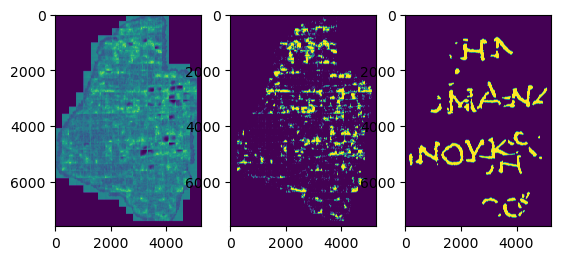

Epoch 1 - Save Best AUC: 0.7570. Model is saved.


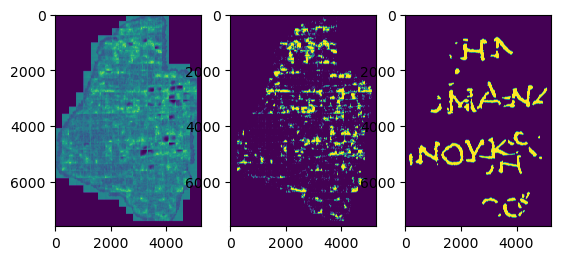

- epoch:2 -
Epoch: [2][0/130] Elapsed 0m 0s (remain 1m 44s) Loss: 0.4796(0.4796) 
Epoch: [2][129/130] Elapsed 0m 36s (remain 0m 0s) Loss: 0.5684(0.4571) 
EVAL: [0/27] Elapsed 0m 0s (remain 0m 5s) Loss: 0.1942(0.1942) 
EVAL: [26/27] Elapsed 0m 4s (remain 0m 0s) Loss: 0.2608(0.3429) 
	 th: 0.1, fbeta: 0.15501010582851737
	 th: 0.15, fbeta: 0.17519831183253376
	 th: 0.2, fbeta: 0.23454631388811426
	 th: 0.25, fbeta: 0.30346723358559297
	 th: 0.3, fbeta: 0.36672475577494495
	 th: 0.35, fbeta: 0.4113047064272223
	 th: 0.4, fbeta: 0.4339095712699823
	 th: 0.45, fbeta: 0.44551884670930836
	 th: 0.5, fbeta: 0.4516478235682448
	 th: 0.55, fbeta: 0.45342112195754647
	 th: 0.6, fbeta: 0.4527950287583949
	 th: 0.65, fbeta: 0.4430063385382714
	 th: 0.7, fbeta: 0.4244989957234525
	 th: 0.75, fbeta: 0.3979664852221416
	 th: 0.8, fbeta: 0.35709970622194637
	 th: 0.85, fbeta: 0.30027456598677216
	 th: 0.9, fbeta: 0.2253528977103783
	 th: 0.95, fbeta: 0.12054950918700931
	 th: 1.0, fbeta: 0.0
	 epoch:2,

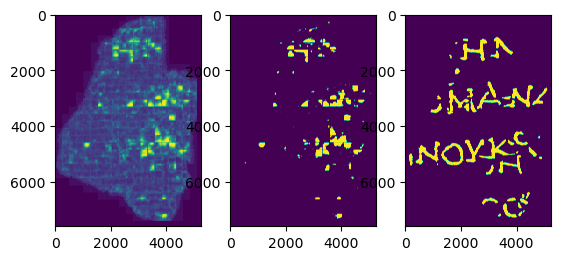

Epoch 2 - Save Best AUC: 0.8612. Model is saved.


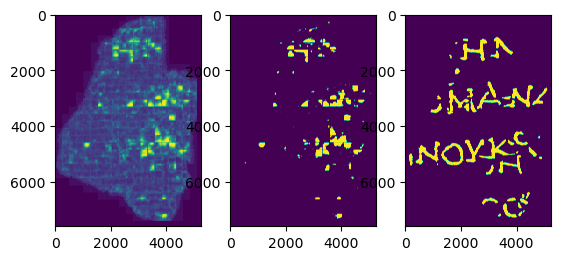

- epoch:3 -
Epoch: [3][0/130] Elapsed 0m 0s (remain 1m 45s) Loss: 0.4161(0.4161) 
Epoch: [3][129/130] Elapsed 0m 36s (remain 0m 0s) Loss: 0.2491(0.3939) 
EVAL: [0/27] Elapsed 0m 0s (remain 0m 5s) Loss: 0.1381(0.1381) 
EVAL: [26/27] Elapsed 0m 4s (remain 0m 0s) Loss: 0.2191(0.2890) 
	 th: 0.1, fbeta: 0.21046580102800155
	 th: 0.15, fbeta: 0.2647231150066251
	 th: 0.2, fbeta: 0.3279559109979341
	 th: 0.25, fbeta: 0.3891883525562919
	 th: 0.3, fbeta: 0.4355768727759609
	 th: 0.35, fbeta: 0.46787284608804613
	 th: 0.4, fbeta: 0.4873369710869359
	 th: 0.45, fbeta: 0.485939959983846
	 th: 0.5, fbeta: 0.4630151587173642
	 th: 0.55, fbeta: 0.42268781537945294
	 th: 0.6, fbeta: 0.3753604396909928
	 th: 0.65, fbeta: 0.3170137298745393
	 th: 0.7, fbeta: 0.24359728638490624
	 th: 0.75, fbeta: 0.1597532106389141
	 th: 0.8, fbeta: 0.10157982322061185
	 th: 0.85, fbeta: 0.0554499615445446
	 th: 0.9, fbeta: 0.026264665705962916
	 th: 0.95, fbeta: 0.004135613953212317
	 th: 1.0, fbeta: 0.0
	 epoch:3, a

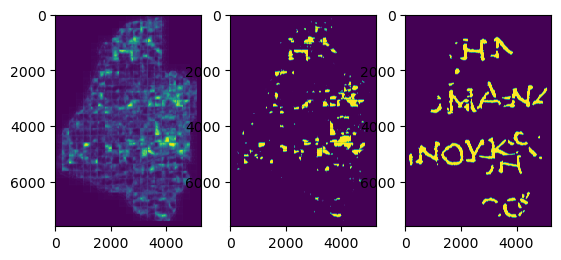

Epoch 3 - Save Best AUC: 0.8713. Model is saved.


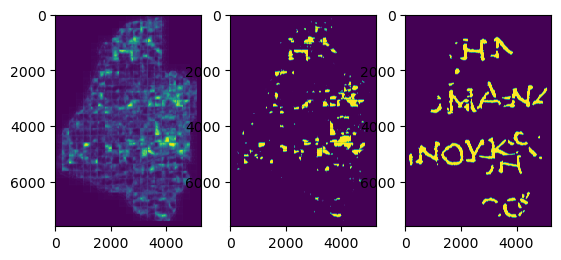

- epoch:4 -
Epoch: [4][0/130] Elapsed 0m 0s (remain 1m 50s) Loss: 0.6135(0.6135) 
Epoch: [4][129/130] Elapsed 0m 35s (remain 0m 0s) Loss: 0.3886(0.3600) 
EVAL: [0/27] Elapsed 0m 0s (remain 0m 5s) Loss: 0.0982(0.0982) 
EVAL: [26/27] Elapsed 0m 4s (remain 0m 0s) Loss: 0.2067(0.2697) 
	 th: 0.1, fbeta: 0.27078849399968113
	 th: 0.15, fbeta: 0.3524704628368772
	 th: 0.2, fbeta: 0.4144461649258425
	 th: 0.25, fbeta: 0.4658073822164549
	 th: 0.3, fbeta: 0.5060910314035716
	 th: 0.35, fbeta: 0.5321134369902512
	 th: 0.4, fbeta: 0.5431009558809301
	 th: 0.45, fbeta: 0.5420167611236898
	 th: 0.5, fbeta: 0.5328175753092448
	 th: 0.55, fbeta: 0.518150147014091
	 th: 0.6, fbeta: 0.49668563420016737
	 th: 0.65, fbeta: 0.4673629490916774
	 th: 0.7, fbeta: 0.42798606196834593
	 th: 0.75, fbeta: 0.39393553881543936
	 th: 0.8, fbeta: 0.3655954180858653
	 th: 0.85, fbeta: 0.34026634531359456
	 th: 0.9, fbeta: 0.3152899669096734
	 th: 0.95, fbeta: 0.272050876159202
	 th: 1.0, fbeta: 0.0
	 epoch:4, avg tr

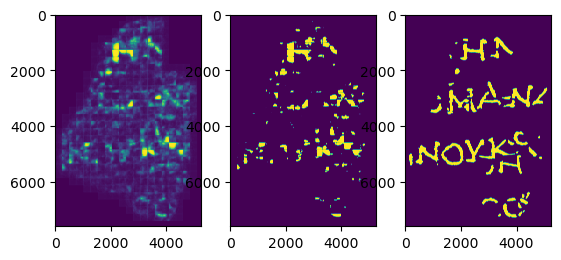

Epoch 4 - Save Best AUC: 0.8954. Model is saved.


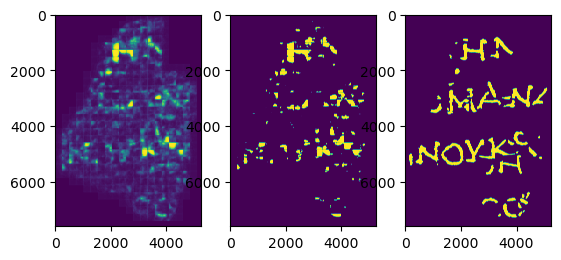

- epoch:5 -
Epoch: [5][0/130] Elapsed 0m 0s (remain 1m 58s) Loss: 0.4815(0.4815) 
Epoch: [5][129/130] Elapsed 0m 36s (remain 0m 0s) Loss: 0.4099(0.3462) 
EVAL: [0/27] Elapsed 0m 0s (remain 0m 5s) Loss: 0.1655(0.1655) 
EVAL: [26/27] Elapsed 0m 4s (remain 0m 0s) Loss: 0.2055(0.2784) 
	 th: 0.1, fbeta: 0.25169863465484466
	 th: 0.15, fbeta: 0.3118708104465843
	 th: 0.2, fbeta: 0.3636610644912355
	 th: 0.25, fbeta: 0.40381120887899496
	 th: 0.3, fbeta: 0.436012376325786
	 th: 0.35, fbeta: 0.46451274346435334
	 th: 0.4, fbeta: 0.4922875924835083
	 th: 0.45, fbeta: 0.5159090463899535
	 th: 0.5, fbeta: 0.5348051357909772
	 th: 0.55, fbeta: 0.5455624509806922
	 th: 0.6, fbeta: 0.5491559244852439
	 th: 0.65, fbeta: 0.5476895642137235
	 th: 0.7, fbeta: 0.5419829795529421
	 th: 0.75, fbeta: 0.531081461406131
	 th: 0.8, fbeta: 0.5165844275252637
	 th: 0.85, fbeta: 0.48949221624139283
	 th: 0.9, fbeta: 0.43609244987179596
	 th: 0.95, fbeta: 0.3092417142031854
	 th: 1.0, fbeta: 0.0
	 epoch:5, avg tr

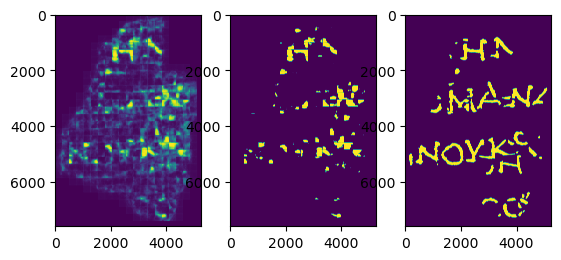

- epoch:6 -
Epoch: [6][0/130] Elapsed 0m 0s (remain 1m 49s) Loss: 0.2804(0.2804) 
Epoch: [6][129/130] Elapsed 0m 35s (remain 0m 0s) Loss: 0.2334(0.3233) 
EVAL: [0/27] Elapsed 0m 0s (remain 0m 5s) Loss: 0.2568(0.2568) 
EVAL: [26/27] Elapsed 0m 4s (remain 0m 0s) Loss: 0.2059(0.3345) 
	 th: 0.1, fbeta: 0.22825128418795454
	 th: 0.15, fbeta: 0.2683388527297523
	 th: 0.2, fbeta: 0.301049166779188
	 th: 0.25, fbeta: 0.33084315680062704
	 th: 0.3, fbeta: 0.35982360394899554
	 th: 0.35, fbeta: 0.3872701264716744
	 th: 0.4, fbeta: 0.40985145359320657
	 th: 0.45, fbeta: 0.4297585373507259
	 th: 0.5, fbeta: 0.44967136236398514
	 th: 0.55, fbeta: 0.4675521016901366
	 th: 0.6, fbeta: 0.48484710884928245
	 th: 0.65, fbeta: 0.4982918609459311
	 th: 0.7, fbeta: 0.505902231001187
	 th: 0.75, fbeta: 0.5101183117915506
	 th: 0.8, fbeta: 0.5068096228130002
	 th: 0.85, fbeta: 0.4978031364175835
	 th: 0.9, fbeta: 0.48015008356731326
	 th: 0.95, fbeta: 0.428702515316146
	 th: 1.0, fbeta: 0.0
	 epoch:6, avg t

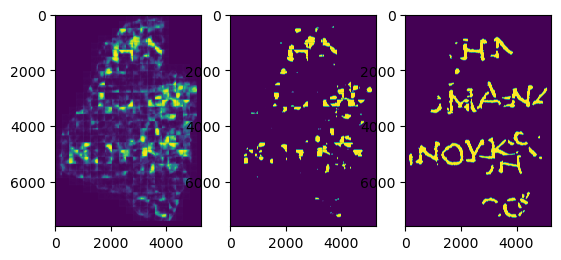

- epoch:8 -
Epoch: [8][0/130] Elapsed 0m 0s (remain 1m 44s) Loss: 0.3255(0.3255) 
Epoch: [8][129/130] Elapsed 0m 34s (remain 0m 0s) Loss: 0.3217(0.2869) 
EVAL: [0/27] Elapsed 0m 0s (remain 0m 5s) Loss: 0.1573(0.1573) 
EVAL: [26/27] Elapsed 0m 4s (remain 0m 0s) Loss: 0.2173(0.2744) 
	 th: 0.1, fbeta: 0.28892085359717246
	 th: 0.15, fbeta: 0.3357124591095115
	 th: 0.2, fbeta: 0.3737015088812557
	 th: 0.25, fbeta: 0.4042209593103151
	 th: 0.3, fbeta: 0.4276406880041512
	 th: 0.35, fbeta: 0.4484713650315613
	 th: 0.4, fbeta: 0.4688369217510036
	 th: 0.45, fbeta: 0.48917252202500733
	 th: 0.5, fbeta: 0.5089160187080429
	 th: 0.55, fbeta: 0.5245736288712818
	 th: 0.6, fbeta: 0.5351065882327309
	 th: 0.65, fbeta: 0.5402875990751556
	 th: 0.7, fbeta: 0.5381398046428203
	 th: 0.75, fbeta: 0.5297774956991194
	 th: 0.8, fbeta: 0.515219937031458
	 th: 0.85, fbeta: 0.4902856842055513
	 th: 0.9, fbeta: 0.4330083095743622
	 th: 0.95, fbeta: 0.2912877483279733
	 th: 1.0, fbeta: 0.0
	 epoch:8, avg trai

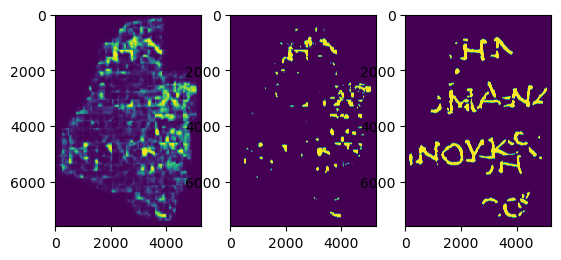

Epoch 1 - Save Best AUC: 0.8765. Model is saved.


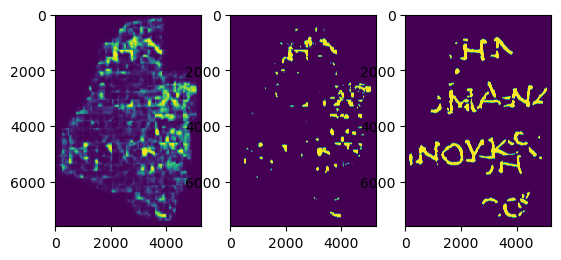

- epoch:2 -
Epoch: [2][0/130] Elapsed 0m 0s (remain 1m 46s) Loss: 0.2180(0.2180) 
Epoch: [2][129/130] Elapsed 0m 35s (remain 0m 0s) Loss: 0.4522(0.2704) 
EVAL: [0/27] Elapsed 0m 0s (remain 0m 5s) Loss: 0.2037(0.2037) 
EVAL: [26/27] Elapsed 0m 4s (remain 0m 0s) Loss: 0.1806(0.3369) 
	 th: 0.1, fbeta: 0.25614906050964215
	 th: 0.15, fbeta: 0.2918622368662015
	 th: 0.2, fbeta: 0.3202083885036053
	 th: 0.25, fbeta: 0.3444299752816875
	 th: 0.3, fbeta: 0.36326975502533737
	 th: 0.35, fbeta: 0.3784534263814239
	 th: 0.4, fbeta: 0.3914920098328953
	 th: 0.45, fbeta: 0.40294890916585263
	 th: 0.5, fbeta: 0.4147803418247168
	 th: 0.55, fbeta: 0.4256684252364103
	 th: 0.6, fbeta: 0.4345192040871451
	 th: 0.65, fbeta: 0.4427427725219867
	 th: 0.7, fbeta: 0.4522049436746491
	 th: 0.75, fbeta: 0.4632010664976978
	 th: 0.8, fbeta: 0.47278853732699405
	 th: 0.85, fbeta: 0.47536077619483436
	 th: 0.9, fbeta: 0.45493818038150186
	 th: 0.95, fbeta: 0.39697609923063687
	 th: 1.0, fbeta: 0.0
	 epoch:2, av

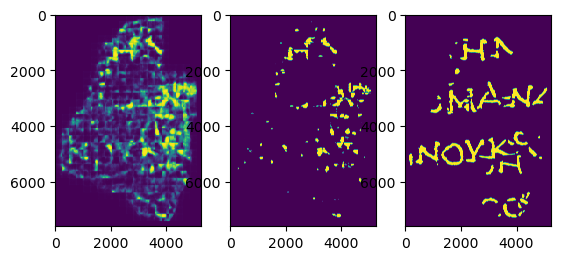

Epoch 2 - Save Best AUC: 0.8805. Model is saved.


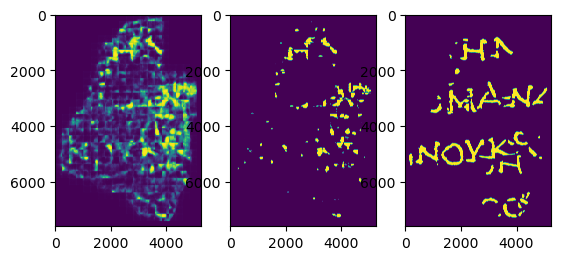

- epoch:3 -
Epoch: [3][0/130] Elapsed 0m 0s (remain 1m 48s) Loss: 0.2361(0.2361) 
Epoch: [3][129/130] Elapsed 0m 35s (remain 0m 0s) Loss: 0.2612(0.2791) 
EVAL: [0/27] Elapsed 0m 0s (remain 0m 5s) Loss: 0.1204(0.1204) 
EVAL: [26/27] Elapsed 0m 4s (remain 0m 0s) Loss: 0.1593(0.3006) 
	 th: 0.1, fbeta: 0.3263007995652822
	 th: 0.15, fbeta: 0.3661535337680862
	 th: 0.2, fbeta: 0.3936943602113507
	 th: 0.25, fbeta: 0.41520347578937133
	 th: 0.3, fbeta: 0.43512577551734155
	 th: 0.35, fbeta: 0.45384086746067154
	 th: 0.4, fbeta: 0.46991905803807416
	 th: 0.45, fbeta: 0.48400890054277984
	 th: 0.5, fbeta: 0.49549210887010064
	 th: 0.55, fbeta: 0.5055533349243951
	 th: 0.6, fbeta: 0.5118294884026102
	 th: 0.65, fbeta: 0.5140664208311287
	 th: 0.7, fbeta: 0.5137630793426264
	 th: 0.75, fbeta: 0.5117012476618337
	 th: 0.8, fbeta: 0.5072996509006565
	 th: 0.85, fbeta: 0.4972700251423682
	 th: 0.9, fbeta: 0.47086779792124644
	 th: 0.95, fbeta: 0.40534313532871924
	 th: 1.0, fbeta: 0.0
	 epoch:3, a

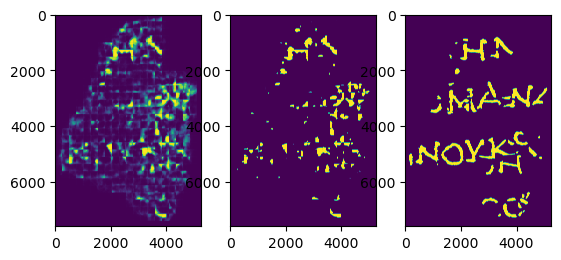

- epoch:4 -
Epoch: [4][0/130] Elapsed 0m 0s (remain 1m 56s) Loss: 0.2045(0.2045) 
Epoch: [4][129/130] Elapsed 0m 36s (remain 0m 0s) Loss: 0.2997(0.2766) 
EVAL: [0/27] Elapsed 0m 0s (remain 0m 5s) Loss: 0.0787(0.0787) 
EVAL: [26/27] Elapsed 0m 4s (remain 0m 0s) Loss: 0.2024(0.2880) 
	 th: 0.1, fbeta: 0.30346715831595983
	 th: 0.15, fbeta: 0.35063583951842303
	 th: 0.2, fbeta: 0.3847205902749411
	 th: 0.25, fbeta: 0.41122193012951297
	 th: 0.3, fbeta: 0.432692574115611
	 th: 0.35, fbeta: 0.4520450130801766
	 th: 0.4, fbeta: 0.47042748084444835
	 th: 0.45, fbeta: 0.4866032472745941
	 th: 0.5, fbeta: 0.4981371444213678
	 th: 0.55, fbeta: 0.5081115651788701
	 th: 0.6, fbeta: 0.5175033823642536
	 th: 0.65, fbeta: 0.5232943413425011
	 th: 0.7, fbeta: 0.5233757404380542
	 th: 0.75, fbeta: 0.5164129745115073
	 th: 0.8, fbeta: 0.5027879662666344
	 th: 0.85, fbeta: 0.4775570830242954
	 th: 0.9, fbeta: 0.4309351417571386
	 th: 0.95, fbeta: 0.3423343845151105
	 th: 1.0, fbeta: 0.0
	 epoch:4, avg tr

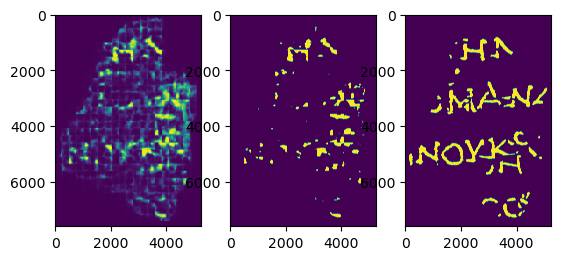

- epoch:5 -
Epoch: [5][0/130] Elapsed 0m 0s (remain 1m 56s) Loss: 0.2178(0.2178) 
Epoch: [5][129/130] Elapsed 0m 34s (remain 0m 0s) Loss: 0.2736(0.2756) 
EVAL: [0/27] Elapsed 0m 0s (remain 0m 5s) Loss: 0.2003(0.2003) 
EVAL: [26/27] Elapsed 0m 4s (remain 0m 0s) Loss: 0.2005(0.2974) 
	 th: 0.1, fbeta: 0.29201111631916926
	 th: 0.15, fbeta: 0.3293360769501224
	 th: 0.2, fbeta: 0.3614084203603256
	 th: 0.25, fbeta: 0.3862964623205998
	 th: 0.3, fbeta: 0.4064944880587915
	 th: 0.35, fbeta: 0.42348155836093854
	 th: 0.4, fbeta: 0.4372948575531058
	 th: 0.45, fbeta: 0.45125204906157723
	 th: 0.5, fbeta: 0.4651717566822236
	 th: 0.55, fbeta: 0.47827509546105723
	 th: 0.6, fbeta: 0.49057670875263665
	 th: 0.65, fbeta: 0.5016078633407733
	 th: 0.7, fbeta: 0.5097763008003509
	 th: 0.75, fbeta: 0.5134267878980422
	 th: 0.8, fbeta: 0.5078550845741863
	 th: 0.85, fbeta: 0.4852281971114742
	 th: 0.9, fbeta: 0.43071302132616723
	 th: 0.95, fbeta: 0.30943529992665775
	 th: 1.0, fbeta: 0.0
	 epoch:5, av

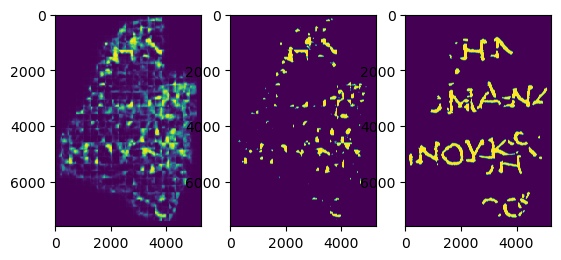

- epoch:6 -
Epoch: [6][0/130] Elapsed 0m 0s (remain 2m 3s) Loss: 0.3032(0.3032) 
Epoch: [6][129/130] Elapsed 0m 35s (remain 0m 0s) Loss: 0.3026(0.2665) 
EVAL: [0/27] Elapsed 0m 0s (remain 0m 5s) Loss: 0.1174(0.1174) 
EVAL: [26/27] Elapsed 0m 4s (remain 0m 0s) Loss: 0.2050(0.2859) 
	 th: 0.1, fbeta: 0.2934967159286325
	 th: 0.15, fbeta: 0.3355782490651653
	 th: 0.2, fbeta: 0.3684827938704876
	 th: 0.25, fbeta: 0.39532821063440854
	 th: 0.3, fbeta: 0.41961199868650084
	 th: 0.35, fbeta: 0.4416089983529305
	 th: 0.4, fbeta: 0.4609290371010163
	 th: 0.45, fbeta: 0.4781749419206362
	 th: 0.5, fbeta: 0.4942008170984785
	 th: 0.55, fbeta: 0.5086785130161539
	 th: 0.6, fbeta: 0.5195094549318464
	 th: 0.65, fbeta: 0.526962767819576
	 th: 0.7, fbeta: 0.5300283938574817
	 th: 0.75, fbeta: 0.5291468819458296
	 th: 0.8, fbeta: 0.5165711829535372
	 th: 0.85, fbeta: 0.4836326722126883
	 th: 0.9, fbeta: 0.4199185210991735
	 th: 0.95, fbeta: 0.2752152517745375
	 th: 1.0, fbeta: 0.0
	 epoch:6, avg train

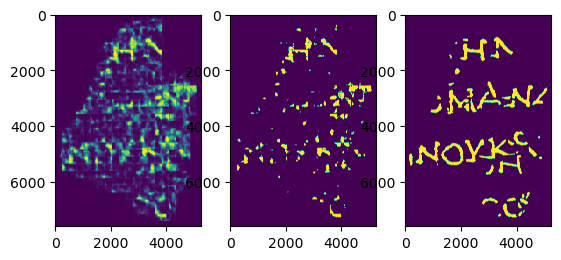

Epoch 6 - Save Best AUC: 0.8935. Model is saved.


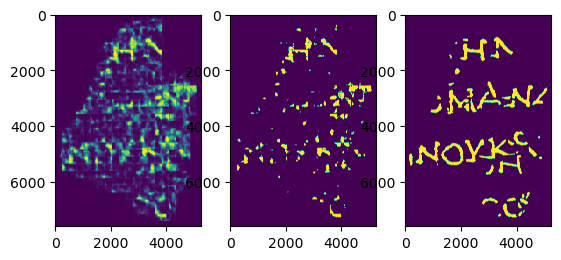

- epoch:7 -
Epoch: [7][0/130] Elapsed 0m 0s (remain 1m 49s) Loss: 0.3202(0.3202) 
Epoch: [7][129/130] Elapsed 0m 35s (remain 0m 0s) Loss: 0.2460(0.2611) 
EVAL: [0/27] Elapsed 0m 0s (remain 0m 5s) Loss: 0.0640(0.0640) 
EVAL: [26/27] Elapsed 0m 4s (remain 0m 0s) Loss: 0.2027(0.2856) 
	 th: 0.1, fbeta: 0.3465629879264969
	 th: 0.15, fbeta: 0.3892488494392488
	 th: 0.2, fbeta: 0.42170193368838826
	 th: 0.25, fbeta: 0.4447162291383573
	 th: 0.3, fbeta: 0.46077351361483265
	 th: 0.35, fbeta: 0.4732877983374466
	 th: 0.4, fbeta: 0.48357055018067624
	 th: 0.45, fbeta: 0.491933979939214
	 th: 0.5, fbeta: 0.4914212817643866
	 th: 0.55, fbeta: 0.4810930869520092
	 th: 0.6, fbeta: 0.4614117984283431
	 th: 0.65, fbeta: 0.42684743081243137
	 th: 0.7, fbeta: 0.37979590457048396
	 th: 0.75, fbeta: 0.32349690643319384
	 th: 0.8, fbeta: 0.2559668144336388
	 th: 0.85, fbeta: 0.16945999322418728
	 th: 0.9, fbeta: 0.0804263047259611
	 th: 0.95, fbeta: 0.014717947950099397
	 th: 1.0, fbeta: 0.0
	 epoch:7, a

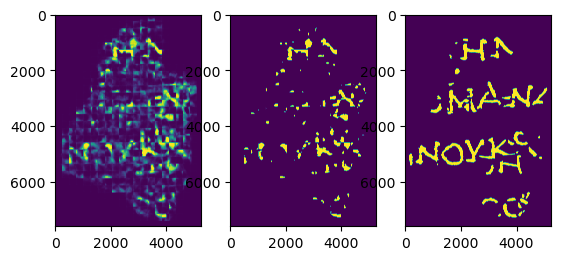

Epoch 10 - Save Best AUC: 0.8937. Model is saved.


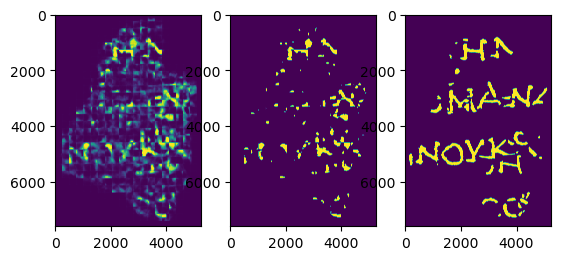

- epoch:11 -
Epoch: [11][0/130] Elapsed 0m 0s (remain 1m 51s) Loss: 0.1654(0.1654) 
Epoch: [11][129/130] Elapsed 0m 34s (remain 0m 0s) Loss: 0.1545(0.2085) 
EVAL: [0/27] Elapsed 0m 0s (remain 0m 5s) Loss: 0.1028(0.1028) 
EVAL: [26/27] Elapsed 0m 4s (remain 0m 0s) Loss: 0.2001(0.3425) 
	 th: 0.1, fbeta: 0.2957479289784041
	 th: 0.15, fbeta: 0.3327744342900479
	 th: 0.2, fbeta: 0.3601121101612515
	 th: 0.25, fbeta: 0.38348175030068843
	 th: 0.3, fbeta: 0.4022514026183955
	 th: 0.35, fbeta: 0.41925043967402753
	 th: 0.4, fbeta: 0.43435512972837276
	 th: 0.45, fbeta: 0.4494670955991015
	 th: 0.5, fbeta: 0.4631693673452453
	 th: 0.55, fbeta: 0.4738512591152789
	 th: 0.6, fbeta: 0.48410866979040845
	 th: 0.65, fbeta: 0.4954692577450264
	 th: 0.7, fbeta: 0.5063434806346905
	 th: 0.75, fbeta: 0.5155101006952403
	 th: 0.8, fbeta: 0.5230560783904663
	 th: 0.85, fbeta: 0.5307539937992549
	 th: 0.9, fbeta: 0.5362028973931001
	 th: 0.95, fbeta: 0.5255166675492664
	 th: 1.0, fbeta: 0.047457735081410

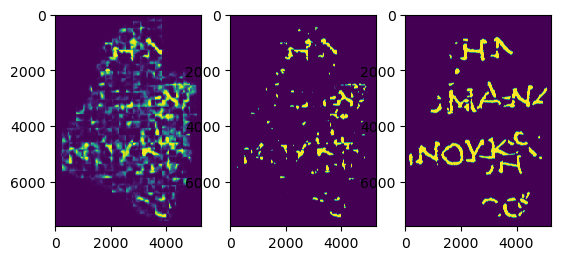

surface_list:  range(25, 35, 3)
initializing dataset...
/working/input/vesuvius-challenge-ink-detection/train/1/mask.png
/working/input/vesuvius-challenge-ink-detection/train/2/mask.png
reading surface volume...
 reading idx : 4/4  => read surface volume done. [1]
 reading idx : 4/4  => read surface volume done. [2]
split grid done.
initializing dataset done.
initializing dataset...
/working/input/vesuvius-challenge-ink-detection/train/3/mask.png
reading surface volume...
 reading idx : 4/4  => read surface volume done. [3]
split grid done.
initializing dataset done.
- epoch:1 -
Epoch: [1][0/130] Elapsed 0m 0s (remain 1m 43s) Loss: 0.1671(0.1671) 
Epoch: [1][129/130] Elapsed 0m 34s (remain 0m 0s) Loss: 0.1985(0.2276) 
EVAL: [0/27] Elapsed 0m 0s (remain 0m 5s) Loss: 0.1497(0.1497) 
EVAL: [26/27] Elapsed 0m 4s (remain 0m 0s) Loss: 0.1980(0.3356) 
	 th: 0.1, fbeta: 0.2952719706327592
	 th: 0.15, fbeta: 0.3237377895463158
	 th: 0.2, fbeta: 0.3457885961074998
	 th: 0.25, fbeta: 0.3649189967

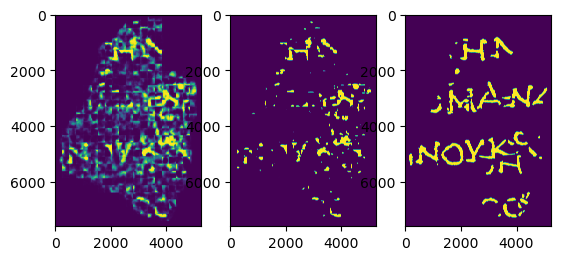

Epoch 1 - Save Best AUC: 0.8900. Model is saved.


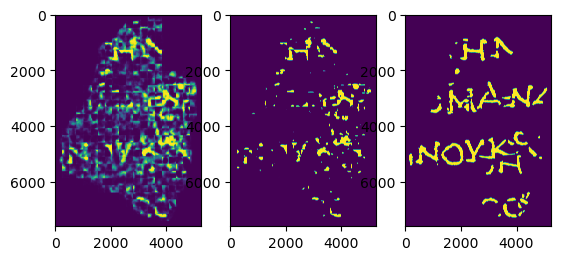

- epoch:2 -
Epoch: [2][0/130] Elapsed 0m 0s (remain 1m 55s) Loss: 0.2214(0.2214) 
Epoch: [2][129/130] Elapsed 0m 35s (remain 0m 0s) Loss: 0.2758(0.2381) 
EVAL: [0/27] Elapsed 0m 0s (remain 0m 5s) Loss: 0.1165(0.1165) 
EVAL: [26/27] Elapsed 0m 4s (remain 0m 0s) Loss: 0.1880(0.3100) 
	 th: 0.1, fbeta: 0.2999211659523254
	 th: 0.15, fbeta: 0.33108877794651614
	 th: 0.2, fbeta: 0.355948656229001
	 th: 0.25, fbeta: 0.3769478549847675
	 th: 0.3, fbeta: 0.39601219258555675
	 th: 0.35, fbeta: 0.4146288110033694
	 th: 0.4, fbeta: 0.4328322860360416
	 th: 0.45, fbeta: 0.451074720110033
	 th: 0.5, fbeta: 0.470190525241189
	 th: 0.55, fbeta: 0.4873012808427609
	 th: 0.6, fbeta: 0.5030144999294047
	 th: 0.65, fbeta: 0.5199791188806384
	 th: 0.7, fbeta: 0.5352636019364314
	 th: 0.75, fbeta: 0.547429973147866
	 th: 0.8, fbeta: 0.5520352496348901
	 th: 0.85, fbeta: 0.5436007446111883
	 th: 0.9, fbeta: 0.5137663043455981
	 th: 0.95, fbeta: 0.4579820104781841
	 th: 1.0, fbeta: 0.008016839793774102
	 epo

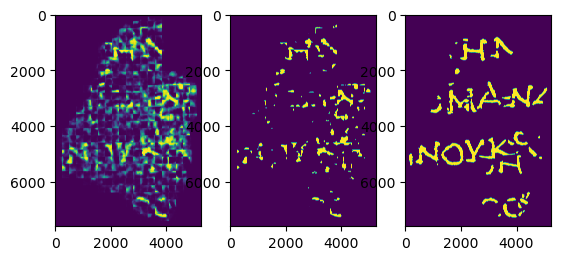

- epoch:5 -
Epoch: [5][0/130] Elapsed 0m 0s (remain 1m 51s) Loss: 0.1672(0.1672) 
Epoch: [5][129/130] Elapsed 0m 34s (remain 0m 0s) Loss: 0.2308(0.2005) 
EVAL: [0/27] Elapsed 0m 0s (remain 0m 5s) Loss: 0.0838(0.0838) 
EVAL: [26/27] Elapsed 0m 4s (remain 0m 0s) Loss: 0.2029(0.2879) 
	 th: 0.1, fbeta: 0.35427873812579813
	 th: 0.15, fbeta: 0.4014000165533299
	 th: 0.2, fbeta: 0.43220815487263065
	 th: 0.25, fbeta: 0.45272777740385245
	 th: 0.3, fbeta: 0.46917377884197603
	 th: 0.35, fbeta: 0.484426985452523
	 th: 0.4, fbeta: 0.49651859896701916
	 th: 0.45, fbeta: 0.5076524800663541
	 th: 0.5, fbeta: 0.518170282707512
	 th: 0.55, fbeta: 0.5257682738695886
	 th: 0.6, fbeta: 0.530306558993587
	 th: 0.65, fbeta: 0.5316907912186278
	 th: 0.7, fbeta: 0.5285371398231883
	 th: 0.75, fbeta: 0.5202845108822851
	 th: 0.8, fbeta: 0.5060874754642476
	 th: 0.85, fbeta: 0.48244632954571304
	 th: 0.9, fbeta: 0.444534474761402
	 th: 0.95, fbeta: 0.3755808192839266
	 th: 1.0, fbeta: 0.008430692228951807
	

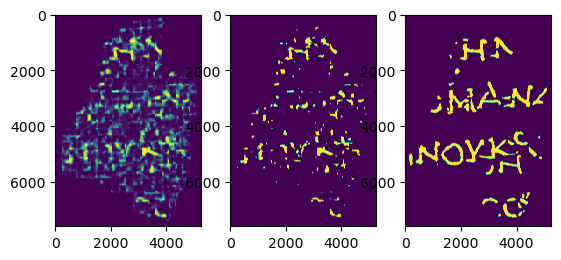

- epoch:13 -
Epoch: [13][0/130] Elapsed 0m 0s (remain 1m 58s) Loss: 0.1717(0.1717) 
Epoch: [13][129/130] Elapsed 0m 37s (remain 0m 0s) Loss: 0.2711(0.1917) 
EVAL: [0/27] Elapsed 0m 0s (remain 0m 5s) Loss: 0.1582(0.1582) 
EVAL: [26/27] Elapsed 0m 4s (remain 0m 0s) Loss: 0.2174(0.3403) 
	 th: 0.1, fbeta: 0.319610476686404
	 th: 0.15, fbeta: 0.346660265661964
	 th: 0.2, fbeta: 0.3677872575673304
	 th: 0.25, fbeta: 0.38569159881808196
	 th: 0.3, fbeta: 0.40239605105191484
	 th: 0.35, fbeta: 0.4189172214079085
	 th: 0.4, fbeta: 0.43496632115317635
	 th: 0.45, fbeta: 0.449801768352574
	 th: 0.5, fbeta: 0.4642683941272856
	 th: 0.55, fbeta: 0.4769430593684173
	 th: 0.6, fbeta: 0.48953903628200396
	 th: 0.65, fbeta: 0.5016230454661028
	 th: 0.7, fbeta: 0.513217903578205
	 th: 0.75, fbeta: 0.5236852350224425
	 th: 0.8, fbeta: 0.5347921166927059
	 th: 0.85, fbeta: 0.5411905046672083
	 th: 0.9, fbeta: 0.5377358381934222
	 th: 0.95, fbeta: 0.49652013617555973
	 th: 1.0, fbeta: 0.0
	 epoch:13, avg 

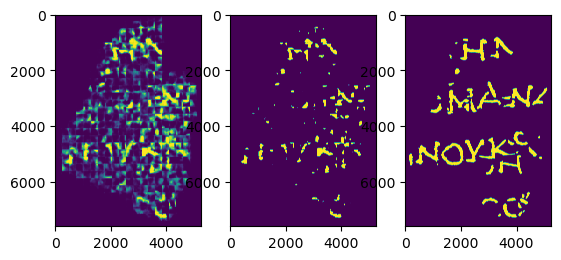

- epoch:15 -
Epoch: [15][0/130] Elapsed 0m 0s (remain 1m 54s) Loss: 0.2212(0.2212) 
Epoch: [15][129/130] Elapsed 0m 34s (remain 0m 0s) Loss: 0.2050(0.1654) 
EVAL: [0/27] Elapsed 0m 0s (remain 0m 5s) Loss: 0.0900(0.0900) 
EVAL: [26/27] Elapsed 0m 4s (remain 0m 0s) Loss: 0.1791(0.3082) 
	 th: 0.1, fbeta: 0.2887219951577375
	 th: 0.15, fbeta: 0.31985627111217285
	 th: 0.2, fbeta: 0.34812981842345914
	 th: 0.25, fbeta: 0.37228498917307645
	 th: 0.3, fbeta: 0.3938618819413615
	 th: 0.35, fbeta: 0.41560895464135245
	 th: 0.4, fbeta: 0.4365506297481089
	 th: 0.45, fbeta: 0.45679769474382825
	 th: 0.5, fbeta: 0.47796173211843435
	 th: 0.55, fbeta: 0.4970240997232001
	 th: 0.6, fbeta: 0.512259065980748
	 th: 0.65, fbeta: 0.523433716190358
	 th: 0.7, fbeta: 0.5295131892981666
	 th: 0.75, fbeta: 0.5302480715157724
	 th: 0.8, fbeta: 0.5245565919272077
	 th: 0.85, fbeta: 0.5007306271152908
	 th: 0.9, fbeta: 0.45106194557356505
	 th: 0.95, fbeta: 0.3538015641083904
	 th: 1.0, fbeta: 0.0
	 epoch:15, 

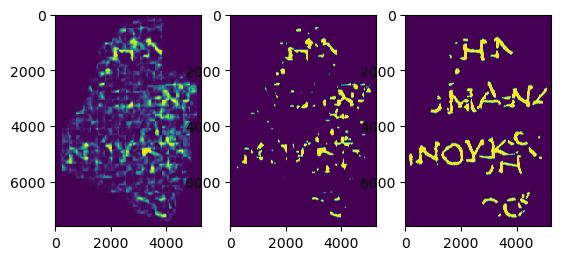

[fold0] slice ave score:0.5605(th=0.600000), auc=0.895604
[fold0] BEST Epoch 14 - Save Best Score:0.5653. Best loss:0.3564
[fold0] BEST AUC Epoch 12 - Save Best Score:0.8940. Best loss:0.2909
-- fold1 training start --
surface_list:  range(26, 36, 3)
initializing dataset...
/working/input/vesuvius-challenge-ink-detection/train/1/mask.png
/working/input/vesuvius-challenge-ink-detection/train/3/mask.png
reading surface volume...
 reading idx : 4/4  => read surface volume done. [1]
 reading idx : 4/4  => read surface volume done. [3]
split grid done.
initializing dataset done.
initializing dataset...
/working/input/vesuvius-challenge-ink-detection/train/2/mask.png
reading surface volume...
 reading idx : 4/4  => read surface volume done. [2]
split grid done.
initializing dataset done.
- epoch:1 -
Epoch: [1][0/58] Elapsed 0m 0s (remain 0m 49s) Loss: 0.7480(0.7480) 
Epoch: [1][57/58] Elapsed 0m 16s (remain 0m 0s) Loss: 0.6328(0.6644) 
EVAL: [0/99] Elapsed 0m 0s (remain 0m 22s) Loss: 0.5979(

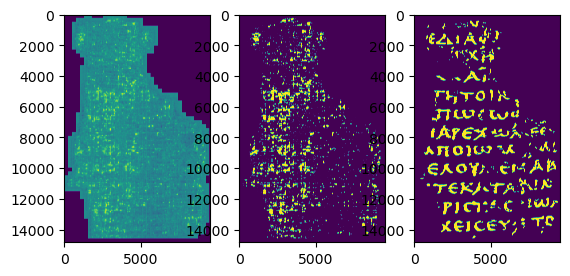

Epoch 1 - Save Best AUC: 0.7636. Model is saved.


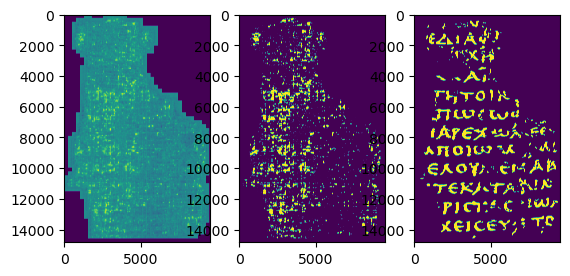

- epoch:2 -
Epoch: [2][0/58] Elapsed 0m 0s (remain 0m 44s) Loss: 0.6486(0.6486) 
Epoch: [2][57/58] Elapsed 0m 17s (remain 0m 0s) Loss: 0.4961(0.5836) 
EVAL: [0/99] Elapsed 0m 0s (remain 0m 23s) Loss: 0.3852(0.3852) 
EVAL: [98/99] Elapsed 0m 16s (remain 0m 0s) Loss: 0.3824(0.7715) 
	 th: 0.1, fbeta: 0.19682020310492132
	 th: 0.15, fbeta: 0.19682020310492132
	 th: 0.2, fbeta: 0.19682039189601302
	 th: 0.25, fbeta: 0.19687541055865604
	 th: 0.3, fbeta: 0.20934320109595858
	 th: 0.35, fbeta: 0.25196272345181037
	 th: 0.4, fbeta: 0.3095916397055132
	 th: 0.45, fbeta: 0.34921070203746024
	 th: 0.5, fbeta: 0.34144207514337593
	 th: 0.55, fbeta: 0.3142257951742919
	 th: 0.6, fbeta: 0.2890648396745948
	 th: 0.65, fbeta: 0.27079934851003085
	 th: 0.7, fbeta: 0.2590757439334149
	 th: 0.75, fbeta: 0.2506668859915788
	 th: 0.8, fbeta: 0.24249702595913378
	 th: 0.85, fbeta: 0.2351443628990843
	 th: 0.9, fbeta: 0.22673491264559628
	 th: 0.95, fbeta: 0.21679582615371515
	 th: 1.0, fbeta: 0.05587188084

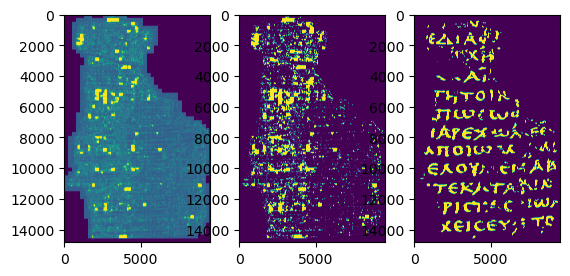

- epoch:3 -
Epoch: [3][0/58] Elapsed 0m 0s (remain 0m 49s) Loss: 0.6055(0.6055) 
Epoch: [3][57/58] Elapsed 0m 16s (remain 0m 0s) Loss: 0.4797(0.5171) 
EVAL: [0/99] Elapsed 0m 0s (remain 0m 21s) Loss: 0.3078(0.3078) 
EVAL: [98/99] Elapsed 0m 15s (remain 0m 0s) Loss: 0.2784(0.4789) 
	 th: 0.1, fbeta: 0.1968202717573235
	 th: 0.15, fbeta: 0.19699007994222273
	 th: 0.2, fbeta: 0.20626401296275138
	 th: 0.25, fbeta: 0.24623954481921065
	 th: 0.3, fbeta: 0.3025409872679435
	 th: 0.35, fbeta: 0.2627006589421326
	 th: 0.4, fbeta: 0.1899485836369378
	 th: 0.45, fbeta: 0.13921575860577576
	 th: 0.5, fbeta: 0.10573485572138747
	 th: 0.55, fbeta: 0.08194153763572117
	 th: 0.6, fbeta: 0.06500192185643867
	 th: 0.65, fbeta: 0.05279047786811952
	 th: 0.7, fbeta: 0.0436041898519544
	 th: 0.75, fbeta: 0.0350594264160726
	 th: 0.8, fbeta: 0.02731123531934434
	 th: 0.85, fbeta: 0.019575416509965502
	 th: 0.9, fbeta: 0.01208666323765012
	 th: 0.95, fbeta: 0.00636506581830365
	 th: 1.0, fbeta: 0.0
	 epoch:

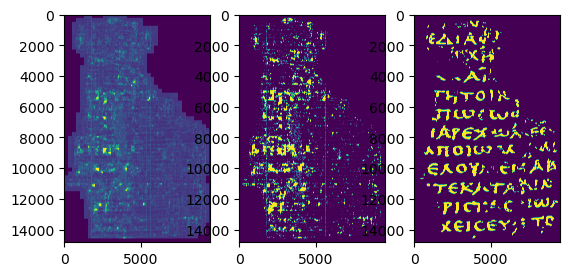

Epoch 4 - Save Best AUC: 0.7821. Model is saved.


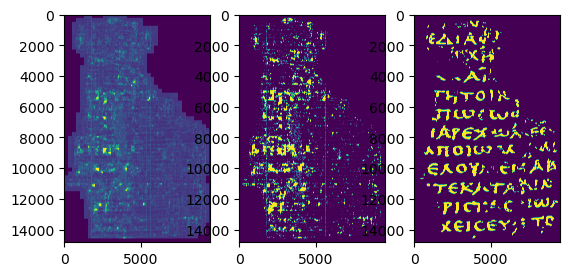

- epoch:5 -
Epoch: [5][0/58] Elapsed 0m 0s (remain 0m 45s) Loss: 0.3700(0.3700) 
Epoch: [5][57/58] Elapsed 0m 16s (remain 0m 0s) Loss: 0.3762(0.3815) 
EVAL: [0/99] Elapsed 0m 0s (remain 0m 22s) Loss: 0.1862(0.1862) 
EVAL: [98/99] Elapsed 0m 16s (remain 0m 0s) Loss: 0.2054(0.4205) 
	 th: 0.1, fbeta: 0.19688568716155308
	 th: 0.15, fbeta: 0.20593034887505196
	 th: 0.2, fbeta: 0.3006563715443117
	 th: 0.25, fbeta: 0.3713646796388622
	 th: 0.3, fbeta: 0.3899508429768847
	 th: 0.35, fbeta: 0.37866892554354753
	 th: 0.4, fbeta: 0.3514083400540134
	 th: 0.45, fbeta: 0.3164128096334079
	 th: 0.5, fbeta: 0.28150540542586694
	 th: 0.55, fbeta: 0.24505637835305003
	 th: 0.6, fbeta: 0.20962531704065676
	 th: 0.65, fbeta: 0.17773337549130874
	 th: 0.7, fbeta: 0.15006124042031624
	 th: 0.75, fbeta: 0.12475023171426063
	 th: 0.8, fbeta: 0.10140022399339593
	 th: 0.85, fbeta: 0.08441535947098798
	 th: 0.9, fbeta: 0.06786872995642147
	 th: 0.95, fbeta: 0.049786353641218674
	 th: 1.0, fbeta: 0.0
	 epoch

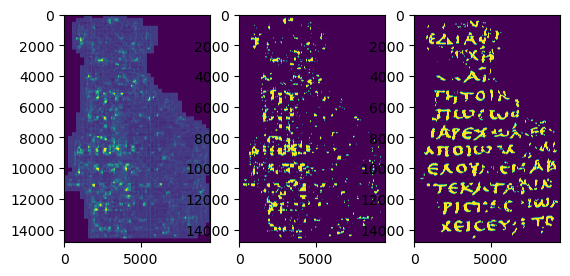

- epoch:6 -
Epoch: [6][0/58] Elapsed 0m 0s (remain 0m 51s) Loss: 0.3190(0.3190) 
Epoch: [6][57/58] Elapsed 0m 16s (remain 0m 0s) Loss: 0.4075(0.3396) 
EVAL: [0/99] Elapsed 0m 0s (remain 0m 23s) Loss: 0.1094(0.1094) 
EVAL: [98/99] Elapsed 0m 16s (remain 0m 0s) Loss: 0.1247(0.4157) 
	 th: 0.1, fbeta: 0.21704652528698254
	 th: 0.15, fbeta: 0.3216194378674641
	 th: 0.2, fbeta: 0.3649957263966999
	 th: 0.25, fbeta: 0.3554240728451948
	 th: 0.3, fbeta: 0.30420320586116234
	 th: 0.35, fbeta: 0.24934860788592209
	 th: 0.4, fbeta: 0.20299608997723428
	 th: 0.45, fbeta: 0.16442599550987266
	 th: 0.5, fbeta: 0.1310389319523016
	 th: 0.55, fbeta: 0.10014674240203286
	 th: 0.6, fbeta: 0.07411641968061053
	 th: 0.65, fbeta: 0.054779624323076745
	 th: 0.7, fbeta: 0.039901861521647285
	 th: 0.75, fbeta: 0.028967021862271132
	 th: 0.8, fbeta: 0.01995633140212455
	 th: 0.85, fbeta: 0.014081278343477194
	 th: 0.9, fbeta: 0.010199407152446478
	 th: 0.95, fbeta: 0.0064543701878016805
	 th: 1.0, fbeta: 0.0


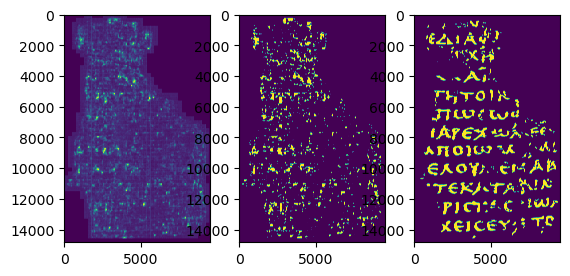

- epoch:8 -
Epoch: [8][0/58] Elapsed 0m 0s (remain 0m 49s) Loss: 0.2794(0.2794) 
Epoch: [8][57/58] Elapsed 0m 16s (remain 0m 0s) Loss: 0.2279(0.2924) 
EVAL: [0/99] Elapsed 0m 0s (remain 0m 22s) Loss: 0.0816(0.0816) 
EVAL: [98/99] Elapsed 0m 16s (remain 0m 0s) Loss: 0.0909(0.4111) 
	 th: 0.1, fbeta: 0.27010466867793914
	 th: 0.15, fbeta: 0.3587224131243547
	 th: 0.2, fbeta: 0.38756714036524104
	 th: 0.25, fbeta: 0.3726828796980716
	 th: 0.3, fbeta: 0.3410176487104262
	 th: 0.35, fbeta: 0.3030823349673117
	 th: 0.4, fbeta: 0.2650900013493667
	 th: 0.45, fbeta: 0.2303542948098525
	 th: 0.5, fbeta: 0.1986141150531177
	 th: 0.55, fbeta: 0.1690502404554701
	 th: 0.6, fbeta: 0.14123632601235228
	 th: 0.65, fbeta: 0.11695571394574471
	 th: 0.7, fbeta: 0.09499834266784599
	 th: 0.75, fbeta: 0.07435643611264742
	 th: 0.8, fbeta: 0.05521180964716259
	 th: 0.85, fbeta: 0.03830581618925138
	 th: 0.9, fbeta: 0.022452267553487806
	 th: 0.95, fbeta: 0.008980513217231883
	 th: 1.0, fbeta: 0.0
	 epoch:8

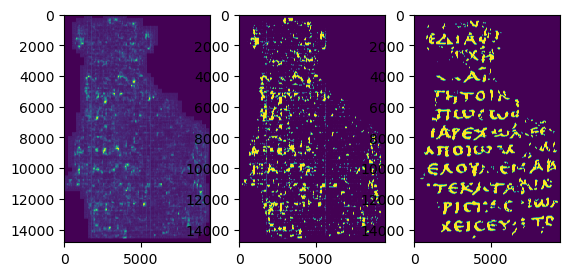

- epoch:9 -
Epoch: [9][0/58] Elapsed 0m 0s (remain 0m 53s) Loss: 0.2600(0.2600) 
Epoch: [9][57/58] Elapsed 0m 16s (remain 0m 0s) Loss: 0.2250(0.2788) 
EVAL: [0/99] Elapsed 0m 0s (remain 0m 23s) Loss: 0.0735(0.0735) 
EVAL: [98/99] Elapsed 0m 16s (remain 0m 0s) Loss: 0.0845(0.4186) 
	 th: 0.1, fbeta: 0.29336713456475033
	 th: 0.15, fbeta: 0.3636481398962636
	 th: 0.2, fbeta: 0.3753401750316145
	 th: 0.25, fbeta: 0.3490606794909483
	 th: 0.3, fbeta: 0.3122549853285355
	 th: 0.35, fbeta: 0.27473053255247193
	 th: 0.4, fbeta: 0.23556760792409132
	 th: 0.45, fbeta: 0.19947488436375405
	 th: 0.5, fbeta: 0.16699247025692612
	 th: 0.55, fbeta: 0.13702907981305174
	 th: 0.6, fbeta: 0.11192929178667836
	 th: 0.65, fbeta: 0.08961291702226484
	 th: 0.7, fbeta: 0.06969468870138297
	 th: 0.75, fbeta: 0.052815829660802026
	 th: 0.8, fbeta: 0.03907531192420205
	 th: 0.85, fbeta: 0.024956609943891584
	 th: 0.9, fbeta: 0.014598109219309265
	 th: 0.95, fbeta: 0.005853334912932631
	 th: 1.0, fbeta: 0.0
	 e

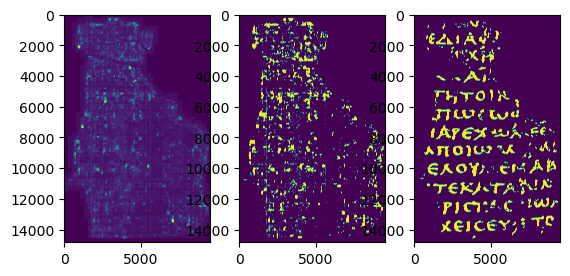

Epoch 1 - Save Best AUC: 0.7687. Model is saved.


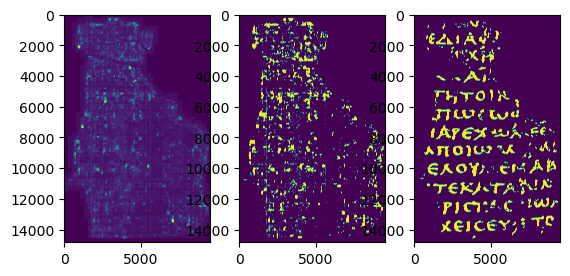

- epoch:2 -
Epoch: [2][0/58] Elapsed 0m 0s (remain 0m 54s) Loss: 0.2892(0.2892) 
Epoch: [2][57/58] Elapsed 0m 16s (remain 0m 0s) Loss: 0.2936(0.2580) 
EVAL: [0/99] Elapsed 0m 0s (remain 0m 23s) Loss: 0.0268(0.0268) 
EVAL: [98/99] Elapsed 0m 16s (remain 0m 0s) Loss: 0.0300(0.4434) 
	 th: 0.1, fbeta: 0.3419214304565445
	 th: 0.15, fbeta: 0.36771998511108644
	 th: 0.2, fbeta: 0.3747893169765278
	 th: 0.25, fbeta: 0.37498981964552663
	 th: 0.3, fbeta: 0.3720728982763413
	 th: 0.35, fbeta: 0.36699717036497864
	 th: 0.4, fbeta: 0.36035166565165366
	 th: 0.45, fbeta: 0.35161820120199205
	 th: 0.5, fbeta: 0.33968976318061467
	 th: 0.55, fbeta: 0.32403136966465235
	 th: 0.6, fbeta: 0.30618154126336117
	 th: 0.65, fbeta: 0.28719160981982833
	 th: 0.7, fbeta: 0.2656934506994345
	 th: 0.75, fbeta: 0.24092343559749899
	 th: 0.8, fbeta: 0.21204388702709734
	 th: 0.85, fbeta: 0.17507327883179585
	 th: 0.9, fbeta: 0.128905319743184
	 th: 0.95, fbeta: 0.07463229383211337
	 th: 1.0, fbeta: 0.0
	 epoch:2

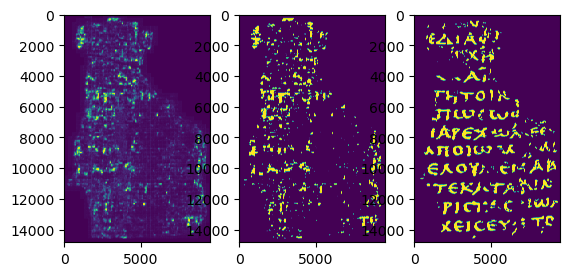

Epoch 2 - Save Best AUC: 0.7909. Model is saved.


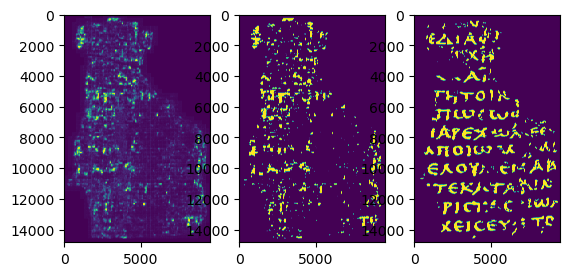

- epoch:3 -
Epoch: [3][0/58] Elapsed 0m 0s (remain 0m 50s) Loss: 0.3085(0.3085) 
Epoch: [3][57/58] Elapsed 0m 16s (remain 0m 0s) Loss: 0.4541(0.2448) 
EVAL: [0/99] Elapsed 0m 0s (remain 0m 23s) Loss: 0.0288(0.0288) 
EVAL: [98/99] Elapsed 0m 16s (remain 0m 0s) Loss: 0.0330(0.4614) 
	 th: 0.1, fbeta: 0.32870737697765656
	 th: 0.15, fbeta: 0.35281595609955485
	 th: 0.2, fbeta: 0.3591338034918346
	 th: 0.25, fbeta: 0.34843602858421746
	 th: 0.3, fbeta: 0.3258467766791511
	 th: 0.35, fbeta: 0.2983951530235787
	 th: 0.4, fbeta: 0.27116768231894883
	 th: 0.45, fbeta: 0.2431211474499723
	 th: 0.5, fbeta: 0.21421910619237086
	 th: 0.55, fbeta: 0.18712241933211535
	 th: 0.6, fbeta: 0.16037405818946626
	 th: 0.65, fbeta: 0.13488290210596984
	 th: 0.7, fbeta: 0.11007807360737626
	 th: 0.75, fbeta: 0.086643433145507
	 th: 0.8, fbeta: 0.06481718420529393
	 th: 0.85, fbeta: 0.046642994134101425
	 th: 0.9, fbeta: 0.030304652272251015
	 th: 0.95, fbeta: 0.01585318546382323
	 th: 1.0, fbeta: 0.0
	 epoch

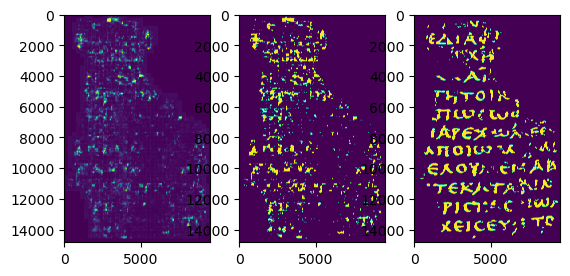

- epoch:6 -
Epoch: [6][0/58] Elapsed 0m 0s (remain 0m 50s) Loss: 0.3445(0.3445) 
Epoch: [6][57/58] Elapsed 0m 16s (remain 0m 0s) Loss: 0.5480(0.2254) 
EVAL: [0/99] Elapsed 0m 0s (remain 0m 23s) Loss: 0.0175(0.0175) 
EVAL: [98/99] Elapsed 0m 16s (remain 0m 0s) Loss: 0.0229(0.5298) 
	 th: 0.1, fbeta: 0.3868472658662927
	 th: 0.15, fbeta: 0.38367578520042434
	 th: 0.2, fbeta: 0.36848916558930644
	 th: 0.25, fbeta: 0.34718804555858485
	 th: 0.3, fbeta: 0.3225820043089142
	 th: 0.35, fbeta: 0.2956541112235268
	 th: 0.4, fbeta: 0.2681488317011856
	 th: 0.45, fbeta: 0.24130207414021512
	 th: 0.5, fbeta: 0.2146993188873845
	 th: 0.55, fbeta: 0.18809973973409239
	 th: 0.6, fbeta: 0.16005329230673582
	 th: 0.65, fbeta: 0.13100398545827105
	 th: 0.7, fbeta: 0.10212343448847629
	 th: 0.75, fbeta: 0.07518058960749593
	 th: 0.8, fbeta: 0.05153172666963541
	 th: 0.85, fbeta: 0.032991969907856585
	 th: 0.9, fbeta: 0.019912847319706998
	 th: 0.95, fbeta: 0.01008958309629365
	 th: 1.0, fbeta: 0.0
	 epoc

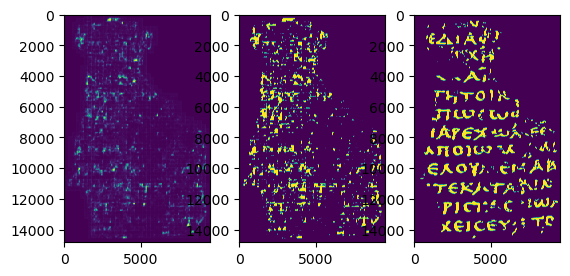

- epoch:7 -
Epoch: [7][0/58] Elapsed 0m 0s (remain 0m 47s) Loss: 0.1628(0.1628) 
Epoch: [7][57/58] Elapsed 0m 16s (remain 0m 0s) Loss: 0.2596(0.2162) 
EVAL: [0/99] Elapsed 0m 0s (remain 0m 22s) Loss: 0.0071(0.0071) 
EVAL: [98/99] Elapsed 0m 16s (remain 0m 0s) Loss: 0.0089(0.5968) 
	 th: 0.1, fbeta: 0.2934575690902456
	 th: 0.15, fbeta: 0.26980605368180993
	 th: 0.2, fbeta: 0.23787449484654585
	 th: 0.25, fbeta: 0.20595826164593764
	 th: 0.3, fbeta: 0.17515702871137817
	 th: 0.35, fbeta: 0.14813469058143217
	 th: 0.4, fbeta: 0.12497955058971767
	 th: 0.45, fbeta: 0.1056177603766159
	 th: 0.5, fbeta: 0.08818572403961956
	 th: 0.55, fbeta: 0.07212916902918062
	 th: 0.6, fbeta: 0.05680574909825384
	 th: 0.65, fbeta: 0.04327507119243001
	 th: 0.7, fbeta: 0.03125132575458189
	 th: 0.75, fbeta: 0.021285207092986355
	 th: 0.8, fbeta: 0.012892923029541387
	 th: 0.85, fbeta: 0.005880022036165945
	 th: 0.9, fbeta: 0.0015335230110463543
	 th: 0.95, fbeta: 2.95529389795171e-07
	 th: 1.0, fbeta: 0.0

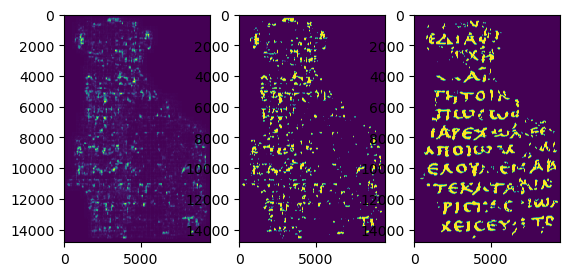

Epoch 9 - Save Best AUC: 0.7970. Model is saved.


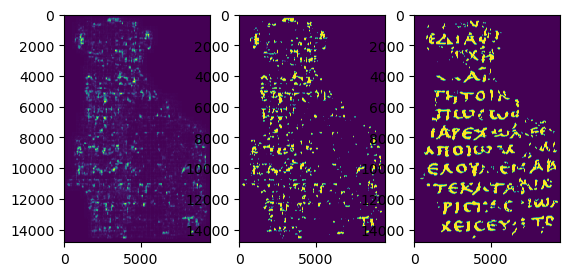

- epoch:10 -
Epoch: [10][0/58] Elapsed 0m 0s (remain 0m 47s) Loss: 0.1576(0.1576) 
Epoch: [10][57/58] Elapsed 0m 16s (remain 0m 0s) Loss: 0.1660(0.1775) 
EVAL: [0/99] Elapsed 0m 0s (remain 0m 23s) Loss: 0.0092(0.0092) 
EVAL: [98/99] Elapsed 0m 16s (remain 0m 0s) Loss: 0.0084(0.5606) 
	 th: 0.1, fbeta: 0.3416162491796511
	 th: 0.15, fbeta: 0.3352850227600849
	 th: 0.2, fbeta: 0.32053439523113814
	 th: 0.25, fbeta: 0.30051764411194287
	 th: 0.3, fbeta: 0.2767505285824733
	 th: 0.35, fbeta: 0.25346360615916275
	 th: 0.4, fbeta: 0.22972719341518993
	 th: 0.45, fbeta: 0.2048195973757049
	 th: 0.5, fbeta: 0.17997054038103816
	 th: 0.55, fbeta: 0.15577247008653622
	 th: 0.6, fbeta: 0.13181577242268028
	 th: 0.65, fbeta: 0.10869990716081519
	 th: 0.7, fbeta: 0.08720715355962552
	 th: 0.75, fbeta: 0.06762930140504093
	 th: 0.8, fbeta: 0.04882135776341727
	 th: 0.85, fbeta: 0.031049242120260407
	 th: 0.9, fbeta: 0.013989504607791747
	 th: 0.95, fbeta: 0.002412324442500975
	 th: 1.0, fbeta: 0.0
	

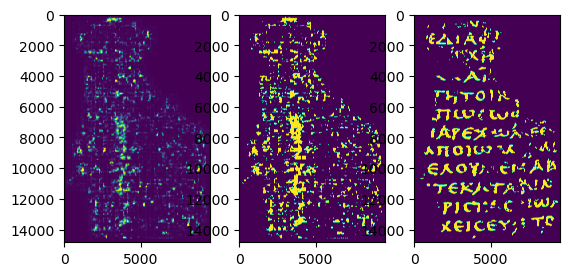

Epoch 1 - Save Best AUC: 0.7756. Model is saved.


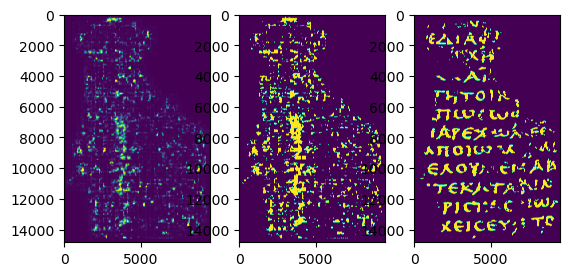

- epoch:2 -
Epoch: [2][0/58] Elapsed 0m 0s (remain 0m 48s) Loss: 0.2615(0.2615) 
Epoch: [2][57/58] Elapsed 0m 15s (remain 0m 0s) Loss: 0.1990(0.2057) 
EVAL: [0/99] Elapsed 0m 0s (remain 0m 23s) Loss: 0.0115(0.0115) 
EVAL: [98/99] Elapsed 0m 16s (remain 0m 0s) Loss: 0.0075(0.5538) 
	 th: 0.1, fbeta: 0.3622717617991809
	 th: 0.15, fbeta: 0.35976903594755694
	 th: 0.2, fbeta: 0.3549987221905137
	 th: 0.25, fbeta: 0.346279094056678
	 th: 0.3, fbeta: 0.3349944199012089
	 th: 0.35, fbeta: 0.3209782704358022
	 th: 0.4, fbeta: 0.3054664536687004
	 th: 0.45, fbeta: 0.28930028550474696
	 th: 0.5, fbeta: 0.27260595957832173
	 th: 0.55, fbeta: 0.2549385292795207
	 th: 0.6, fbeta: 0.23606354664040166
	 th: 0.65, fbeta: 0.21501840850151605
	 th: 0.7, fbeta: 0.19256201026852193
	 th: 0.75, fbeta: 0.16829164107360076
	 th: 0.8, fbeta: 0.14130611540213495
	 th: 0.85, fbeta: 0.1136554659035084
	 th: 0.9, fbeta: 0.08381322000964822
	 th: 0.95, fbeta: 0.04805131706362346
	 th: 1.0, fbeta: 0.0
	 epoch:2, a

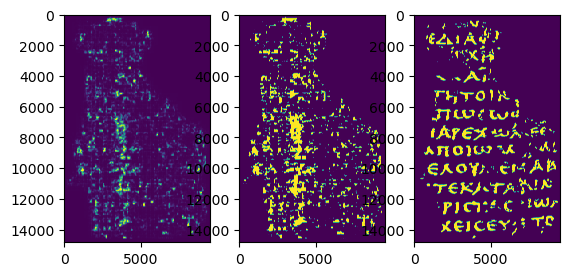

Epoch 2 - Save Best AUC: 0.7935. Model is saved.


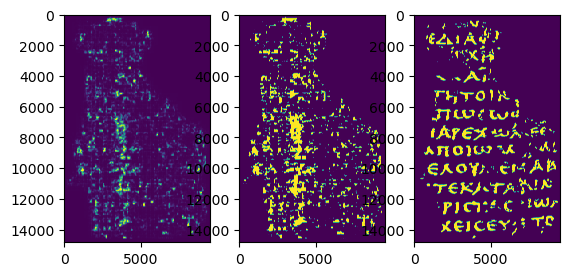

- epoch:3 -
Epoch: [3][0/58] Elapsed 0m 0s (remain 0m 49s) Loss: 0.1182(0.1182) 
Epoch: [3][57/58] Elapsed 0m 15s (remain 0m 0s) Loss: 0.1713(0.1819) 
EVAL: [0/99] Elapsed 0m 0s (remain 0m 22s) Loss: 0.0170(0.0170) 
EVAL: [98/99] Elapsed 0m 16s (remain 0m 0s) Loss: 0.0088(0.5172) 
	 th: 0.1, fbeta: 0.3562441092045705
	 th: 0.15, fbeta: 0.3625080881116127
	 th: 0.2, fbeta: 0.3629599635296385
	 th: 0.25, fbeta: 0.3588731994654086
	 th: 0.3, fbeta: 0.3511311512504725
	 th: 0.35, fbeta: 0.34100520941544205
	 th: 0.4, fbeta: 0.32921247524808783
	 th: 0.45, fbeta: 0.3141848983212881
	 th: 0.5, fbeta: 0.29562105189107174
	 th: 0.55, fbeta: 0.275358067986151
	 th: 0.6, fbeta: 0.25329230869896663
	 th: 0.65, fbeta: 0.22989866937972483
	 th: 0.7, fbeta: 0.2055591007608674
	 th: 0.75, fbeta: 0.1809496597628991
	 th: 0.8, fbeta: 0.1552992210884428
	 th: 0.85, fbeta: 0.12735451961779978
	 th: 0.9, fbeta: 0.09379631835996805
	 th: 0.95, fbeta: 0.055759727730442195
	 th: 1.0, fbeta: 0.0
	 epoch:3, av

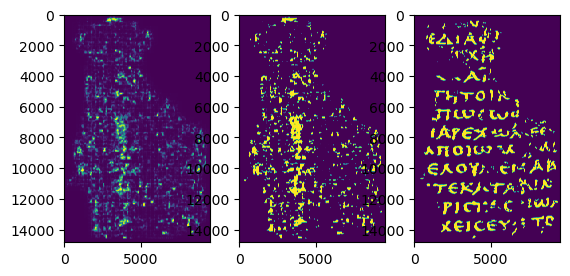

Epoch 3 - Save Best AUC: 0.7958. Model is saved.


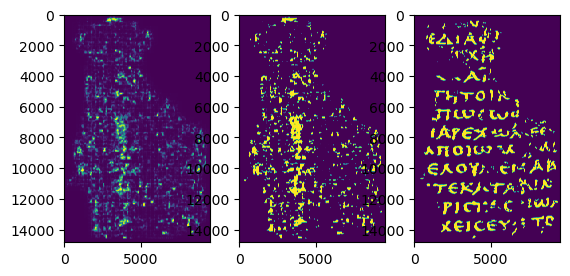

- epoch:4 -
Epoch: [4][0/58] Elapsed 0m 0s (remain 0m 50s) Loss: 0.1312(0.1312) 
Epoch: [4][57/58] Elapsed 0m 16s (remain 0m 0s) Loss: 0.3246(0.1729) 
EVAL: [0/99] Elapsed 0m 0s (remain 0m 23s) Loss: 0.0079(0.0079) 
EVAL: [98/99] Elapsed 0m 16s (remain 0m 0s) Loss: 0.0060(0.5598) 
	 th: 0.1, fbeta: 0.37399616202786706
	 th: 0.15, fbeta: 0.37360296370531754
	 th: 0.2, fbeta: 0.3676274169090544
	 th: 0.25, fbeta: 0.3568724892237467
	 th: 0.3, fbeta: 0.34061299583861665
	 th: 0.35, fbeta: 0.32105847659520576
	 th: 0.4, fbeta: 0.29992617976657837
	 th: 0.45, fbeta: 0.2764587950778199
	 th: 0.5, fbeta: 0.2521921787280678
	 th: 0.55, fbeta: 0.22614870700812614
	 th: 0.6, fbeta: 0.19794134970807686
	 th: 0.65, fbeta: 0.1705146068592772
	 th: 0.7, fbeta: 0.14403579867214833
	 th: 0.75, fbeta: 0.118748949292741
	 th: 0.8, fbeta: 0.09450208982557737
	 th: 0.85, fbeta: 0.07005656188315994
	 th: 0.9, fbeta: 0.044516378086493884
	 th: 0.95, fbeta: 0.020974789336584417
	 th: 1.0, fbeta: 0.0
	 epoch:

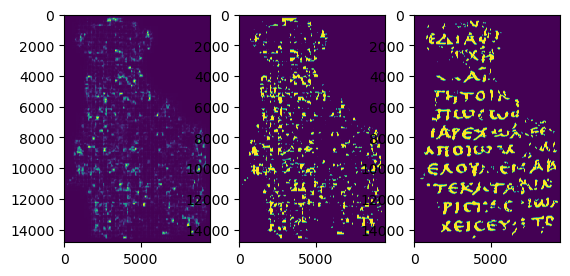

- epoch:5 -
Epoch: [5][0/58] Elapsed 0m 0s (remain 0m 53s) Loss: 0.1838(0.1838) 
Epoch: [5][57/58] Elapsed 0m 16s (remain 0m 0s) Loss: 0.1336(0.1603) 
EVAL: [0/99] Elapsed 0m 0s (remain 0m 23s) Loss: 0.0083(0.0083) 
EVAL: [98/99] Elapsed 0m 16s (remain 0m 0s) Loss: 0.0077(0.5446) 
	 th: 0.1, fbeta: 0.35747280634996487
	 th: 0.15, fbeta: 0.3579557797953907
	 th: 0.2, fbeta: 0.35212323470178625
	 th: 0.25, fbeta: 0.3445339625543998
	 th: 0.3, fbeta: 0.3355660210548707
	 th: 0.35, fbeta: 0.3247590749464449
	 th: 0.4, fbeta: 0.3122534292869829
	 th: 0.45, fbeta: 0.29762897760605467
	 th: 0.5, fbeta: 0.2820592301096592
	 th: 0.55, fbeta: 0.2659356462087681
	 th: 0.6, fbeta: 0.24848100233771356
	 th: 0.65, fbeta: 0.2290107053430969
	 th: 0.7, fbeta: 0.2067812408996351
	 th: 0.75, fbeta: 0.18165294352760242
	 th: 0.8, fbeta: 0.1532880405588542
	 th: 0.85, fbeta: 0.1220519052058164
	 th: 0.9, fbeta: 0.08902440802062678
	 th: 0.95, fbeta: 0.0503875592266007
	 th: 1.0, fbeta: 0.0
	 epoch:5, avg 

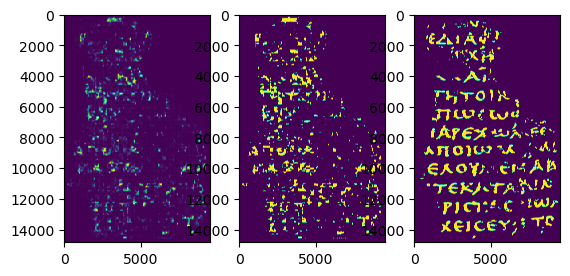

- epoch:8 -
Epoch: [8][0/58] Elapsed 0m 0s (remain 0m 52s) Loss: 0.1158(0.1158) 
Epoch: [8][57/58] Elapsed 0m 16s (remain 0m 0s) Loss: 0.2695(0.1600) 
EVAL: [0/99] Elapsed 0m 0s (remain 0m 23s) Loss: 0.0257(0.0257) 
EVAL: [98/99] Elapsed 0m 16s (remain 0m 0s) Loss: 0.0066(0.6317) 
	 th: 0.1, fbeta: 0.35802085541898465
	 th: 0.15, fbeta: 0.35496887006151195
	 th: 0.2, fbeta: 0.34855843941533726
	 th: 0.25, fbeta: 0.33837489718052105
	 th: 0.3, fbeta: 0.32681365285599334
	 th: 0.35, fbeta: 0.314217604411497
	 th: 0.4, fbeta: 0.30058028153514
	 th: 0.45, fbeta: 0.2856539205057337
	 th: 0.5, fbeta: 0.2686017753543073
	 th: 0.55, fbeta: 0.25037933483060176
	 th: 0.6, fbeta: 0.2303327187054518
	 th: 0.65, fbeta: 0.20891029502254213
	 th: 0.7, fbeta: 0.18607752105304062
	 th: 0.75, fbeta: 0.1619701155511771
	 th: 0.8, fbeta: 0.13660246561180733
	 th: 0.85, fbeta: 0.10834244031891649
	 th: 0.9, fbeta: 0.07386829253850132
	 th: 0.95, fbeta: 0.036626089025023685
	 th: 1.0, fbeta: 0.0
	 epoch:8, 

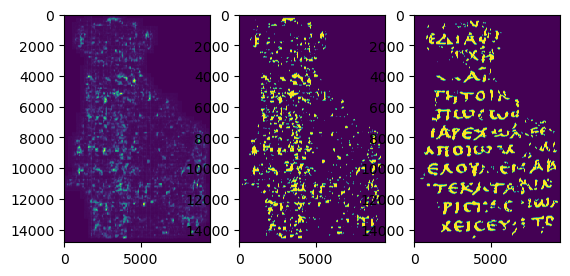

[fold1] slice ave score:0.3812(th=0.150000), auc=0.796646
[fold1] BEST Epoch 7 - Save Best Score:0.3968. Best loss:0.6026
[fold1] BEST AUC Epoch 3 - Save Best Score:0.7958. Best loss:0.5172
-- fold2 training start --
surface_list:  range(26, 36, 3)
initializing dataset...
/working/input/vesuvius-challenge-ink-detection/train/2/mask.png
/working/input/vesuvius-challenge-ink-detection/train/3/mask.png
reading surface volume...
 reading idx : 4/4  => read surface volume done. [2]
 reading idx : 4/4  => read surface volume done. [3]
split grid done.
initializing dataset done.
initializing dataset...
/working/input/vesuvius-challenge-ink-detection/train/1/mask.png
reading surface volume...
 reading idx : 4/4  => read surface volume done. [1]
split grid done.
initializing dataset done.
- epoch:1 -
Epoch: [1][0/125] Elapsed 0m 0s (remain 1m 52s) Loss: 0.7045(0.7045) 
Epoch: [1][124/125] Elapsed 0m 35s (remain 0m 0s) Loss: 0.5388(0.6069) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.4158(

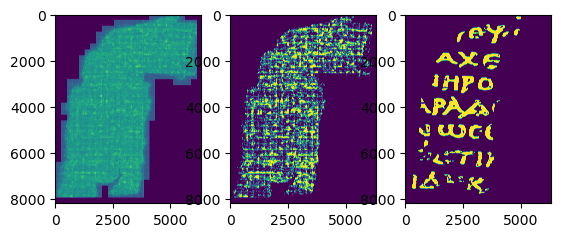

Epoch 1 - Save Best AUC: 0.8305. Model is saved.


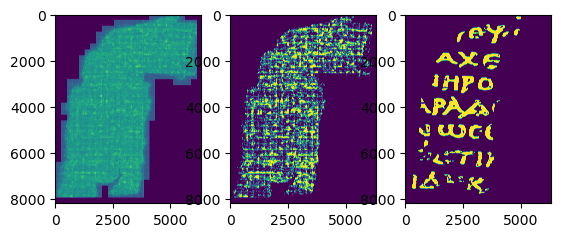

- epoch:2 -
Epoch: [2][0/125] Elapsed 0m 0s (remain 1m 57s) Loss: 0.5518(0.5518) 
Epoch: [2][124/125] Elapsed 0m 36s (remain 0m 0s) Loss: 0.5252(0.4739) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.3215(0.3215) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.2684(0.5055) 
	 th: 0.1, fbeta: 0.19837702975839522
	 th: 0.15, fbeta: 0.22157498234263945
	 th: 0.2, fbeta: 0.23807055496354143
	 th: 0.25, fbeta: 0.25673163410451366
	 th: 0.3, fbeta: 0.2830371442064178
	 th: 0.35, fbeta: 0.30715685794840564
	 th: 0.4, fbeta: 0.3286937238094728
	 th: 0.45, fbeta: 0.3462862002923719
	 th: 0.5, fbeta: 0.3573758717681383
	 th: 0.55, fbeta: 0.3595284220478138
	 th: 0.6, fbeta: 0.34931909145608714
	 th: 0.65, fbeta: 0.2989100039756036
	 th: 0.7, fbeta: 0.17985650733373904
	 th: 0.75, fbeta: 0.06163290533779996
	 th: 0.8, fbeta: 0.013897399551807216
	 th: 0.85, fbeta: 0.00041560999240812773
	 th: 0.9, fbeta: 0.0
	 th: 0.95, fbeta: 0.0
	 th: 1.0, fbeta: 0.0
	 epoch:2, avg train loss:0.4739, av

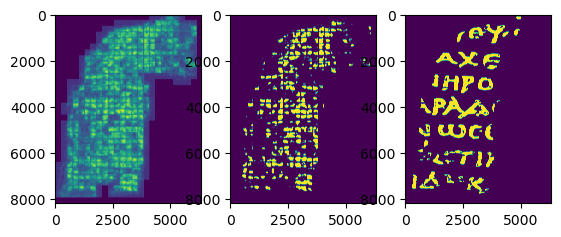

Epoch 2 - Save Best AUC: 0.8559. Model is saved.


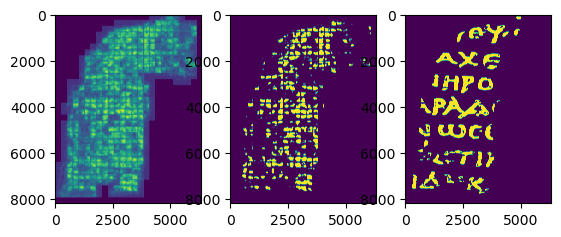

- epoch:3 -
Epoch: [3][0/125] Elapsed 0m 0s (remain 1m 58s) Loss: 0.3908(0.3908) 
Epoch: [3][124/125] Elapsed 0m 35s (remain 0m 0s) Loss: 0.5307(0.3809) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.1785(0.1785) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.1264(0.3779) 
	 th: 0.1, fbeta: 0.25683705376903576
	 th: 0.15, fbeta: 0.31482995451301016
	 th: 0.2, fbeta: 0.3726371686702558
	 th: 0.25, fbeta: 0.41224841700275705
	 th: 0.3, fbeta: 0.43219117745708746
	 th: 0.35, fbeta: 0.4405285861597863
	 th: 0.4, fbeta: 0.44489627852412994
	 th: 0.45, fbeta: 0.4455958540476119
	 th: 0.5, fbeta: 0.4450529508421103
	 th: 0.55, fbeta: 0.4414361868576826
	 th: 0.6, fbeta: 0.43003339779994804
	 th: 0.65, fbeta: 0.4101007398035286
	 th: 0.7, fbeta: 0.37363941869983797
	 th: 0.75, fbeta: 0.31798014345343206
	 th: 0.8, fbeta: 0.24407881325214895
	 th: 0.85, fbeta: 0.15720114284228495
	 th: 0.9, fbeta: 0.055878806533669466
	 th: 0.95, fbeta: 0.0028531015211633354
	 th: 1.0, fbeta: 0.0
	 epo

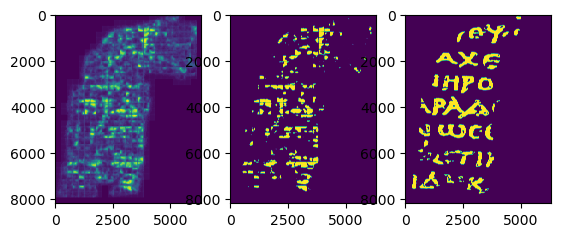

Epoch 3 - Save Best AUC: 0.8756. Model is saved.


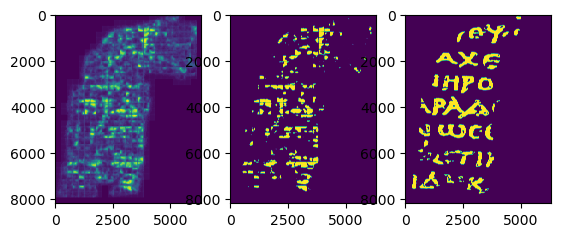

- epoch:4 -
Epoch: [4][0/125] Elapsed 0m 0s (remain 1m 47s) Loss: 0.3296(0.3296) 
Epoch: [4][124/125] Elapsed 0m 34s (remain 0m 0s) Loss: 0.2654(0.3464) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.3561(0.3561) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.1755(0.5665) 
	 th: 0.1, fbeta: 0.25517044839356723
	 th: 0.15, fbeta: 0.2737309140535785
	 th: 0.2, fbeta: 0.291293693156122
	 th: 0.25, fbeta: 0.3062919486555012
	 th: 0.3, fbeta: 0.3210776448182608
	 th: 0.35, fbeta: 0.33590567466165294
	 th: 0.4, fbeta: 0.35039788433308283
	 th: 0.45, fbeta: 0.3647911112049166
	 th: 0.5, fbeta: 0.37946516618816056
	 th: 0.55, fbeta: 0.3943597469394476
	 th: 0.6, fbeta: 0.40866237664367566
	 th: 0.65, fbeta: 0.4211743195195007
	 th: 0.7, fbeta: 0.4322516818297588
	 th: 0.75, fbeta: 0.44346514875680565
	 th: 0.8, fbeta: 0.4545497138170629
	 th: 0.85, fbeta: 0.46054530100998037
	 th: 0.9, fbeta: 0.45394444044552584
	 th: 0.95, fbeta: 0.4045638087989592
	 th: 1.0, fbeta: 0.0
	 epoch:4, av

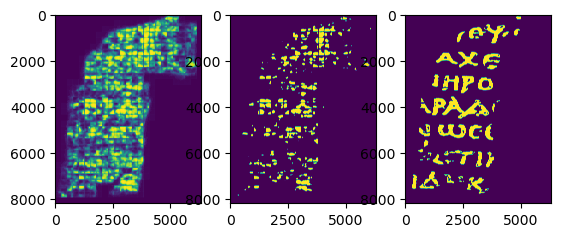

Epoch 4 - Save Best AUC: 0.8782. Model is saved.


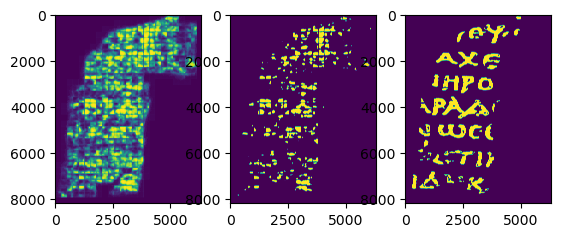

- epoch:5 -
Epoch: [5][0/125] Elapsed 0m 0s (remain 1m 59s) Loss: 0.3513(0.3513) 
Epoch: [5][124/125] Elapsed 0m 33s (remain 0m 0s) Loss: 0.4329(0.3253) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.1476(0.1476) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.0995(0.3746) 
	 th: 0.1, fbeta: 0.31373667273655853
	 th: 0.15, fbeta: 0.3624406300116394
	 th: 0.2, fbeta: 0.4011878558096346
	 th: 0.25, fbeta: 0.42908562976013603
	 th: 0.3, fbeta: 0.4498331107082079
	 th: 0.35, fbeta: 0.46514685717635973
	 th: 0.4, fbeta: 0.4764577942629012
	 th: 0.45, fbeta: 0.48509600038450323
	 th: 0.5, fbeta: 0.4899764710196616
	 th: 0.55, fbeta: 0.49091892485592625
	 th: 0.6, fbeta: 0.48859138801431445
	 th: 0.65, fbeta: 0.4803873517755087
	 th: 0.7, fbeta: 0.4651252964128062
	 th: 0.75, fbeta: 0.44211304831899856
	 th: 0.8, fbeta: 0.4048745512694346
	 th: 0.85, fbeta: 0.3525456260442593
	 th: 0.9, fbeta: 0.2841869575194214
	 th: 0.95, fbeta: 0.16802674183755698
	 th: 1.0, fbeta: 0.0
	 epoch:5, a

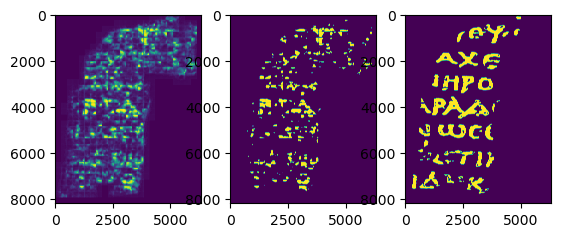

- epoch:6 -
Epoch: [6][0/125] Elapsed 0m 0s (remain 1m 57s) Loss: 0.3940(0.3940) 
Epoch: [6][124/125] Elapsed 0m 33s (remain 0m 0s) Loss: 0.2640(0.3004) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.1987(0.1987) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.1113(0.3779) 
	 th: 0.1, fbeta: 0.3071660435633619
	 th: 0.15, fbeta: 0.3513521199885701
	 th: 0.2, fbeta: 0.38512950652966416
	 th: 0.25, fbeta: 0.411964043221373
	 th: 0.3, fbeta: 0.43430278113911625
	 th: 0.35, fbeta: 0.45215722929376023
	 th: 0.4, fbeta: 0.4673535577839983
	 th: 0.45, fbeta: 0.4811970781947332
	 th: 0.5, fbeta: 0.4926376735741714
	 th: 0.55, fbeta: 0.5013847450701001
	 th: 0.6, fbeta: 0.5059152961579545
	 th: 0.65, fbeta: 0.507822280877939
	 th: 0.7, fbeta: 0.502631374155099
	 th: 0.75, fbeta: 0.4835183124065786
	 th: 0.8, fbeta: 0.453946807264404
	 th: 0.85, fbeta: 0.4081619462034365
	 th: 0.9, fbeta: 0.3272723556441976
	 th: 0.95, fbeta: 0.1926872237965576
	 th: 1.0, fbeta: 0.0
	 epoch:6, avg train 

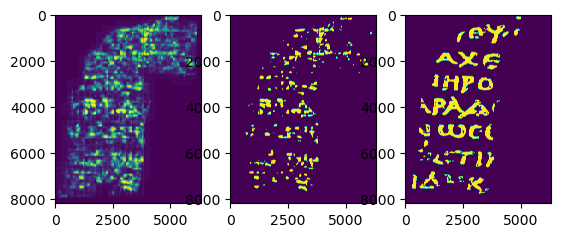

Epoch 6 - Save Best AUC: 0.8842. Model is saved.


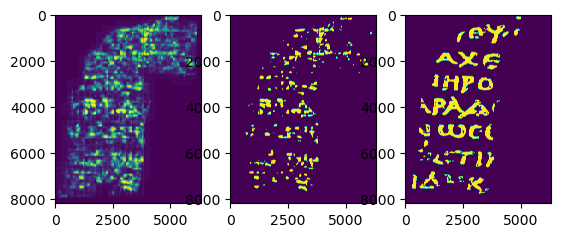

- epoch:7 -
Epoch: [7][0/125] Elapsed 0m 0s (remain 1m 49s) Loss: 0.2185(0.2185) 
Epoch: [7][124/125] Elapsed 0m 33s (remain 0m 0s) Loss: 0.2774(0.2873) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.1630(0.1630) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.1339(0.3706) 
	 th: 0.1, fbeta: 0.3016842496368336
	 th: 0.15, fbeta: 0.338824137549191
	 th: 0.2, fbeta: 0.36835788827890137
	 th: 0.25, fbeta: 0.39574746434092745
	 th: 0.3, fbeta: 0.4196802776036171
	 th: 0.35, fbeta: 0.4430421481894448
	 th: 0.4, fbeta: 0.46579883991323684
	 th: 0.45, fbeta: 0.48657240171411653
	 th: 0.5, fbeta: 0.5048978810327002
	 th: 0.55, fbeta: 0.5149927218578216
	 th: 0.6, fbeta: 0.5165445571173055
	 th: 0.65, fbeta: 0.5108789981507377
	 th: 0.7, fbeta: 0.4972627927380469
	 th: 0.75, fbeta: 0.4765712536443016
	 th: 0.8, fbeta: 0.43460238981085625
	 th: 0.85, fbeta: 0.36445200410314493
	 th: 0.9, fbeta: 0.2535672243481234
	 th: 0.95, fbeta: 0.09227673112752426
	 th: 1.0, fbeta: 0.0
	 epoch:7, avg

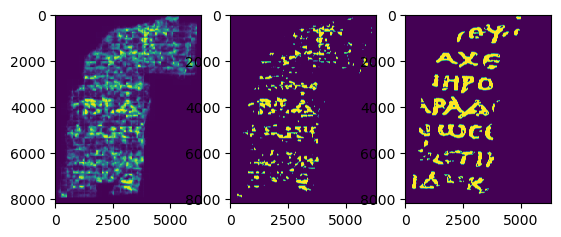

Epoch 7 - Save Best AUC: 0.8885. Model is saved.


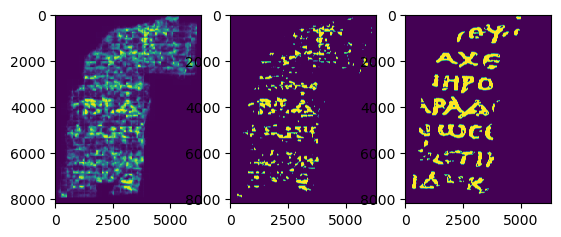

- epoch:8 -
Epoch: [8][0/125] Elapsed 0m 0s (remain 1m 55s) Loss: 0.2858(0.2858) 
Epoch: [8][124/125] Elapsed 0m 34s (remain 0m 0s) Loss: 0.1885(0.2706) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.1773(0.1773) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.1621(0.3891) 
	 th: 0.1, fbeta: 0.30782862346802536
	 th: 0.15, fbeta: 0.34066937834649913
	 th: 0.2, fbeta: 0.36597382444238385
	 th: 0.25, fbeta: 0.38698254454535735
	 th: 0.3, fbeta: 0.40571932124672666
	 th: 0.35, fbeta: 0.42355306493624123
	 th: 0.4, fbeta: 0.44241945759146956
	 th: 0.45, fbeta: 0.46028336025132477
	 th: 0.5, fbeta: 0.47825422373678844
	 th: 0.55, fbeta: 0.4936210413501296
	 th: 0.6, fbeta: 0.5049696970311673
	 th: 0.65, fbeta: 0.5110913502251516
	 th: 0.7, fbeta: 0.5090907600826614
	 th: 0.75, fbeta: 0.4931860462160378
	 th: 0.8, fbeta: 0.4679888472619155
	 th: 0.85, fbeta: 0.4228102634796548
	 th: 0.9, fbeta: 0.35197575506719375
	 th: 0.95, fbeta: 0.20235340801969057
	 th: 1.0, fbeta: 0.0
	 epoch:8

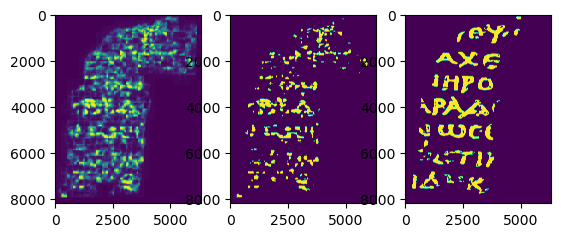

Epoch 10 - Save Best AUC: 0.8893. Model is saved.


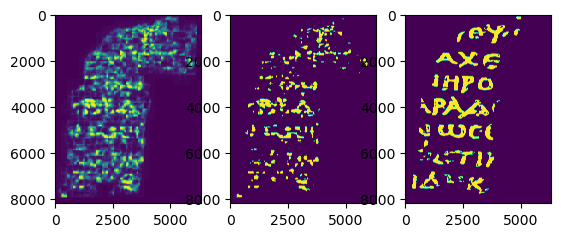

- epoch:11 -
Epoch: [11][0/125] Elapsed 0m 0s (remain 1m 41s) Loss: 0.2163(0.2163) 
Epoch: [11][124/125] Elapsed 0m 33s (remain 0m 0s) Loss: 0.3054(0.2487) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.1576(0.1576) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.1470(0.3695) 
	 th: 0.1, fbeta: 0.32950063390596135
	 th: 0.15, fbeta: 0.3661713432148781
	 th: 0.2, fbeta: 0.39492527327171384
	 th: 0.25, fbeta: 0.42130556968632066
	 th: 0.3, fbeta: 0.4438874481459742
	 th: 0.35, fbeta: 0.4647403729262324
	 th: 0.4, fbeta: 0.4835662066331665
	 th: 0.45, fbeta: 0.5005564128802951
	 th: 0.5, fbeta: 0.5151743935025503
	 th: 0.55, fbeta: 0.5256999707459874
	 th: 0.6, fbeta: 0.5314008064960559
	 th: 0.65, fbeta: 0.5308910931005362
	 th: 0.7, fbeta: 0.5216506215426668
	 th: 0.75, fbeta: 0.499635150626818
	 th: 0.8, fbeta: 0.46782382771117603
	 th: 0.85, fbeta: 0.42351399395301575
	 th: 0.9, fbeta: 0.3589375141587403
	 th: 0.95, fbeta: 0.2268936838738517
	 th: 1.0, fbeta: 0.0
	 epoch:11, a

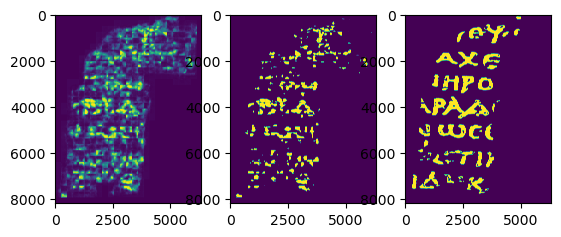

Epoch 11 - Save Best AUC: 0.8904. Model is saved.


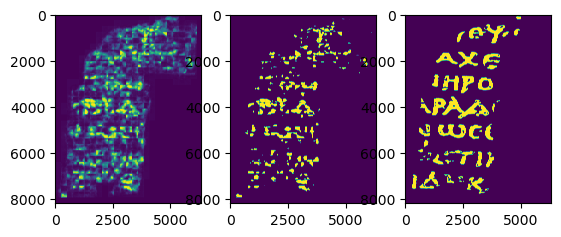

- epoch:12 -
Epoch: [12][0/125] Elapsed 0m 0s (remain 1m 49s) Loss: 0.2353(0.2353) 
Epoch: [12][124/125] Elapsed 0m 33s (remain 0m 0s) Loss: 0.2878(0.2448) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.1696(0.1696) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.1520(0.3872) 
	 th: 0.1, fbeta: 0.314179376638119
	 th: 0.15, fbeta: 0.3481092060497229
	 th: 0.2, fbeta: 0.37298780492076267
	 th: 0.25, fbeta: 0.39677156517194045
	 th: 0.3, fbeta: 0.41866831045545166
	 th: 0.35, fbeta: 0.4376993392120781
	 th: 0.4, fbeta: 0.4563809518839036
	 th: 0.45, fbeta: 0.47408515301202897
	 th: 0.5, fbeta: 0.49048097113296074
	 th: 0.55, fbeta: 0.5058634212237803
	 th: 0.6, fbeta: 0.5176253006494834
	 th: 0.65, fbeta: 0.5243016807232683
	 th: 0.7, fbeta: 0.5232733924138137
	 th: 0.75, fbeta: 0.5134769057467715
	 th: 0.8, fbeta: 0.4900892977085202
	 th: 0.85, fbeta: 0.45424334520860926
	 th: 0.9, fbeta: 0.3976898581593115
	 th: 0.95, fbeta: 0.2782742525390081
	 th: 1.0, fbeta: 0.0
	 epoch:12, 

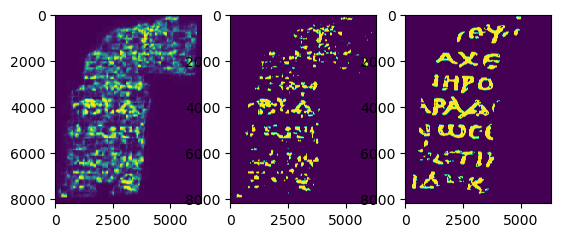

- epoch:14 -
Epoch: [14][0/125] Elapsed 0m 0s (remain 1m 41s) Loss: 0.2742(0.2742) 
Epoch: [14][124/125] Elapsed 0m 34s (remain 0m 0s) Loss: 0.1729(0.2462) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.1940(0.1940) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.1473(0.3986) 
	 th: 0.1, fbeta: 0.3054992630626005
	 th: 0.15, fbeta: 0.33630239330305184
	 th: 0.2, fbeta: 0.35944004448788747
	 th: 0.25, fbeta: 0.3812084240608056
	 th: 0.3, fbeta: 0.4004815128922306
	 th: 0.35, fbeta: 0.4184607986837361
	 th: 0.4, fbeta: 0.43494841341520557
	 th: 0.45, fbeta: 0.45134936329260983
	 th: 0.5, fbeta: 0.4671944004413333
	 th: 0.55, fbeta: 0.48204902152427825
	 th: 0.6, fbeta: 0.4950720502851575
	 th: 0.65, fbeta: 0.507692475634329
	 th: 0.7, fbeta: 0.514955123782848
	 th: 0.75, fbeta: 0.5137676896693367
	 th: 0.8, fbeta: 0.4992874785172121
	 th: 0.85, fbeta: 0.4703315139916815
	 th: 0.9, fbeta: 0.4137592592634315
	 th: 0.95, fbeta: 0.27897982139094973
	 th: 1.0, fbeta: 0.0
	 epoch:14, a

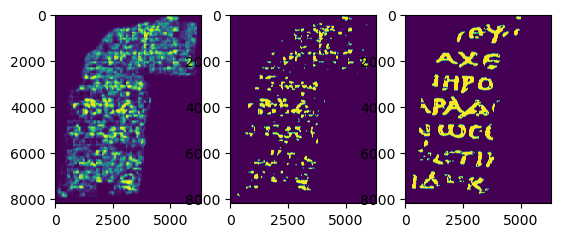

Epoch 1 - Save Best AUC: 0.8773. Model is saved.


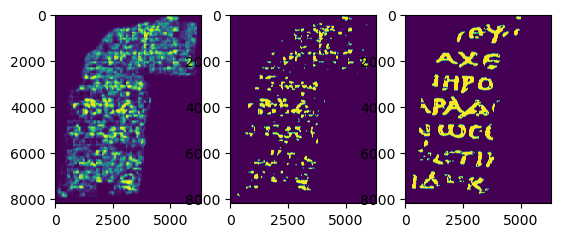

- epoch:2 -
Epoch: [2][0/125] Elapsed 0m 0s (remain 1m 54s) Loss: 0.2351(0.2351) 
Epoch: [2][124/125] Elapsed 0m 34s (remain 0m 0s) Loss: 0.2282(0.2623) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.2093(0.2093) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.0801(0.4381) 
	 th: 0.1, fbeta: 0.3647004119434302
	 th: 0.15, fbeta: 0.3932332815043494
	 th: 0.2, fbeta: 0.41451410390493754
	 th: 0.25, fbeta: 0.4300571265670999
	 th: 0.3, fbeta: 0.44370160285775423
	 th: 0.35, fbeta: 0.4556032198042866
	 th: 0.4, fbeta: 0.4664758818833277
	 th: 0.45, fbeta: 0.47606007750270957
	 th: 0.5, fbeta: 0.4846764916326784
	 th: 0.55, fbeta: 0.4931143001595998
	 th: 0.6, fbeta: 0.5006648146058185
	 th: 0.65, fbeta: 0.5065038612577957
	 th: 0.7, fbeta: 0.5105171475349334
	 th: 0.75, fbeta: 0.5126571960409092
	 th: 0.8, fbeta: 0.5111869137467245
	 th: 0.85, fbeta: 0.5054271852716469
	 th: 0.9, fbeta: 0.48576204605197015
	 th: 0.95, fbeta: 0.4399382793400584
	 th: 1.0, fbeta: 0.0
	 epoch:2, avg t

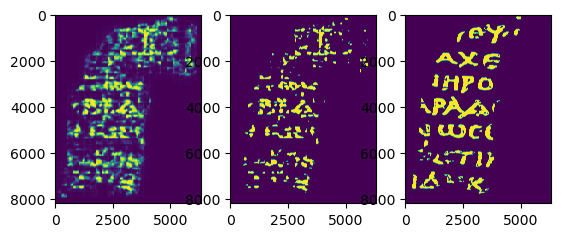

Epoch 2 - Save Best AUC: 0.8851. Model is saved.


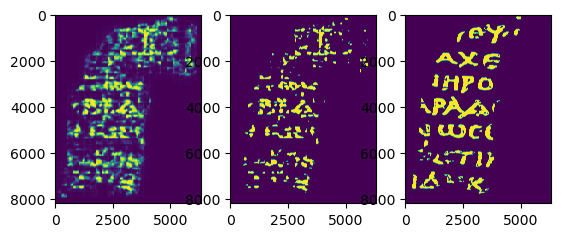

- epoch:3 -
Epoch: [3][0/125] Elapsed 0m 0s (remain 1m 57s) Loss: 0.1696(0.1696) 
Epoch: [3][124/125] Elapsed 0m 33s (remain 0m 0s) Loss: 0.2694(0.2672) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.1680(0.1680) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.1536(0.3998) 
	 th: 0.1, fbeta: 0.30378759112010356
	 th: 0.15, fbeta: 0.3334021073486128
	 th: 0.2, fbeta: 0.3583298683161245
	 th: 0.25, fbeta: 0.3813066951911421
	 th: 0.3, fbeta: 0.4022696714730644
	 th: 0.35, fbeta: 0.4214749691083626
	 th: 0.4, fbeta: 0.4419461998191608
	 th: 0.45, fbeta: 0.46186055105719365
	 th: 0.5, fbeta: 0.47949762031220206
	 th: 0.55, fbeta: 0.4941951048730196
	 th: 0.6, fbeta: 0.5040146717224488
	 th: 0.65, fbeta: 0.5093095739116006
	 th: 0.7, fbeta: 0.510021288566303
	 th: 0.75, fbeta: 0.5056528273608756
	 th: 0.8, fbeta: 0.4924743478617719
	 th: 0.85, fbeta: 0.4693464597523376
	 th: 0.9, fbeta: 0.4243565994689652
	 th: 0.95, fbeta: 0.3347668638400208
	 th: 1.0, fbeta: 0.0
	 epoch:3, avg tra

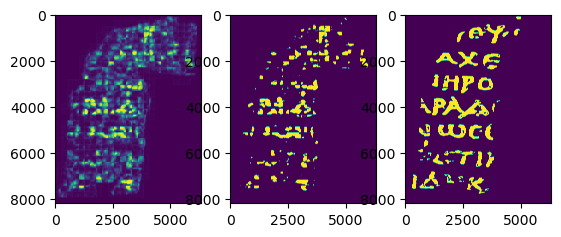

Epoch 4 - Save Best AUC: 0.8865. Model is saved.


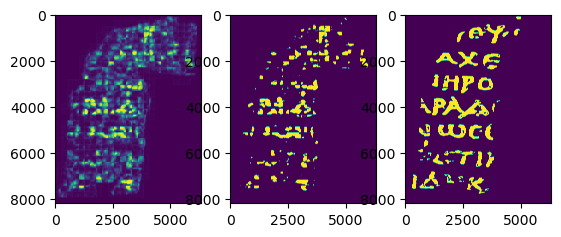

- epoch:5 -
Epoch: [5][0/125] Elapsed 0m 0s (remain 1m 58s) Loss: 0.4149(0.4149) 
Epoch: [5][124/125] Elapsed 0m 34s (remain 0m 0s) Loss: 0.2491(0.2546) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.1732(0.1732) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.0978(0.3730) 
	 th: 0.1, fbeta: 0.3186852509641539
	 th: 0.15, fbeta: 0.34845595395131196
	 th: 0.2, fbeta: 0.3731082196074968
	 th: 0.25, fbeta: 0.39623248562224467
	 th: 0.3, fbeta: 0.41673216965915805
	 th: 0.35, fbeta: 0.43503351257573064
	 th: 0.4, fbeta: 0.453596443272956
	 th: 0.45, fbeta: 0.4691853271544161
	 th: 0.5, fbeta: 0.4795257125395221
	 th: 0.55, fbeta: 0.4857416282938168
	 th: 0.6, fbeta: 0.48705541692026877
	 th: 0.65, fbeta: 0.4811490823774343
	 th: 0.7, fbeta: 0.46025139416214667
	 th: 0.75, fbeta: 0.42357620894234943
	 th: 0.8, fbeta: 0.36913056042459563
	 th: 0.85, fbeta: 0.29997045746468587
	 th: 0.9, fbeta: 0.21015310104035062
	 th: 0.95, fbeta: 0.0976614467130619
	 th: 1.0, fbeta: 0.0
	 epoch:5, 

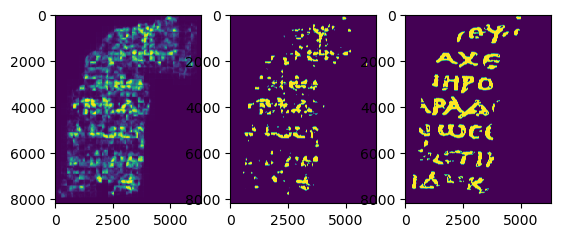

Epoch 6 - Save Best AUC: 0.8984. Model is saved.


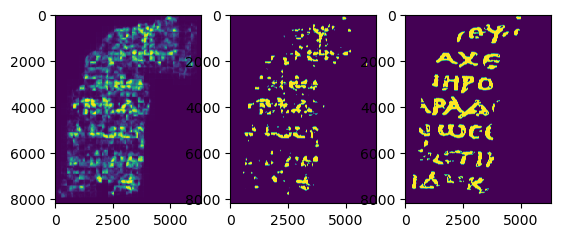

- epoch:7 -
Epoch: [7][0/125] Elapsed 0m 0s (remain 1m 52s) Loss: 0.2060(0.2060) 
Epoch: [7][124/125] Elapsed 0m 33s (remain 0m 0s) Loss: 0.1643(0.2430) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.1319(0.1319) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.1066(0.3907) 
	 th: 0.1, fbeta: 0.3739103573569644
	 th: 0.15, fbeta: 0.408719184229437
	 th: 0.2, fbeta: 0.4351454507853468
	 th: 0.25, fbeta: 0.4553245182442023
	 th: 0.3, fbeta: 0.47098283003102287
	 th: 0.35, fbeta: 0.48362378795397903
	 th: 0.4, fbeta: 0.4925243950222177
	 th: 0.45, fbeta: 0.5000029006383253
	 th: 0.5, fbeta: 0.5058072852236914
	 th: 0.55, fbeta: 0.5082574532772364
	 th: 0.6, fbeta: 0.5086068893086103
	 th: 0.65, fbeta: 0.5047826783773898
	 th: 0.7, fbeta: 0.49771328711186613
	 th: 0.75, fbeta: 0.4863732997439167
	 th: 0.8, fbeta: 0.4666739524534262
	 th: 0.85, fbeta: 0.43516026090915627
	 th: 0.9, fbeta: 0.38415506859487947
	 th: 0.95, fbeta: 0.30091926106388767
	 th: 1.0, fbeta: 0.0
	 epoch:7, avg 

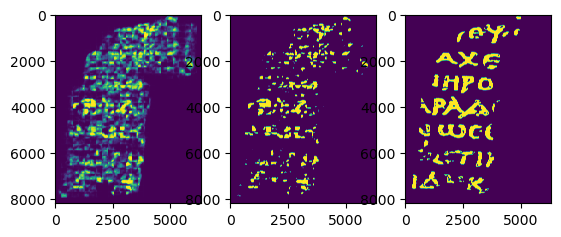

- epoch:13 -
Epoch: [13][0/125] Elapsed 0m 0s (remain 1m 59s) Loss: 0.1455(0.1455) 
Epoch: [13][124/125] Elapsed 0m 33s (remain 0m 0s) Loss: 0.1198(0.1720) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.2012(0.2012) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.1372(0.3964) 
	 th: 0.1, fbeta: 0.35987644931799445
	 th: 0.15, fbeta: 0.3926631070330916
	 th: 0.2, fbeta: 0.419205817980359
	 th: 0.25, fbeta: 0.44082640089980135
	 th: 0.3, fbeta: 0.4595538222758168
	 th: 0.35, fbeta: 0.47630263919272847
	 th: 0.4, fbeta: 0.49196099585784814
	 th: 0.45, fbeta: 0.5072594754745609
	 th: 0.5, fbeta: 0.5194106839969722
	 th: 0.55, fbeta: 0.5294861626073192
	 th: 0.6, fbeta: 0.5376552475398075
	 th: 0.65, fbeta: 0.5439075295783407
	 th: 0.7, fbeta: 0.5454951212713692
	 th: 0.75, fbeta: 0.5424374816633946
	 th: 0.8, fbeta: 0.5314331053424851
	 th: 0.85, fbeta: 0.5152663453142182
	 th: 0.9, fbeta: 0.4865254749365481
	 th: 0.95, fbeta: 0.4357763197205246
	 th: 1.0, fbeta: 0.0683670020952941

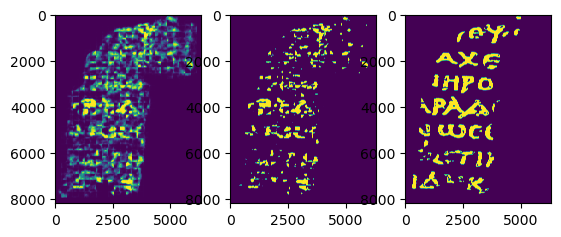

- epoch:14 -
Epoch: [14][0/125] Elapsed 0m 0s (remain 1m 46s) Loss: 0.1063(0.1063) 
Epoch: [14][124/125] Elapsed 0m 33s (remain 0m 0s) Loss: 0.1090(0.1638) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.1979(0.1979) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.1400(0.4110) 
	 th: 0.1, fbeta: 0.36244144148349416
	 th: 0.15, fbeta: 0.3915719242423577
	 th: 0.2, fbeta: 0.4134176606453395
	 th: 0.25, fbeta: 0.431862943380613
	 th: 0.3, fbeta: 0.4499551315658478
	 th: 0.35, fbeta: 0.466014066228555
	 th: 0.4, fbeta: 0.4811318498569378
	 th: 0.45, fbeta: 0.49576026065260365
	 th: 0.5, fbeta: 0.5095293862761051
	 th: 0.55, fbeta: 0.5217856135555445
	 th: 0.6, fbeta: 0.5330495299952892
	 th: 0.65, fbeta: 0.5400036787280186
	 th: 0.7, fbeta: 0.5427545163324782
	 th: 0.75, fbeta: 0.5423755875241631
	 th: 0.8, fbeta: 0.5345038330274088
	 th: 0.85, fbeta: 0.5187825585303516
	 th: 0.9, fbeta: 0.49180921281699075
	 th: 0.95, fbeta: 0.4360831908367578
	 th: 1.0, fbeta: 0.07146628781115172


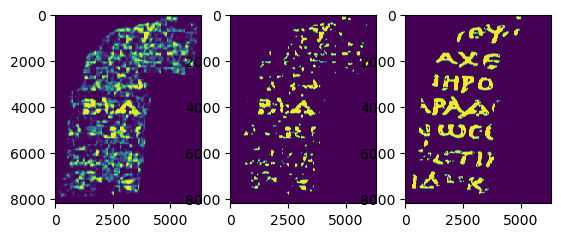

Epoch 1 - Save Best AUC: 0.8867. Model is saved.


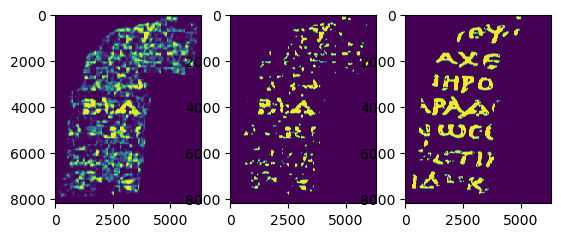

- epoch:2 -
Epoch: [2][0/125] Elapsed 0m 0s (remain 1m 55s) Loss: 0.2468(0.2468) 
Epoch: [2][124/125] Elapsed 0m 33s (remain 0m 0s) Loss: 0.1423(0.2141) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.2768(0.2768) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.1484(0.4492) 
	 th: 0.1, fbeta: 0.3262227749099398
	 th: 0.15, fbeta: 0.3486050989356675
	 th: 0.2, fbeta: 0.3672242305355397
	 th: 0.25, fbeta: 0.38355470453707013
	 th: 0.3, fbeta: 0.39936234266373827
	 th: 0.35, fbeta: 0.41445306950965977
	 th: 0.4, fbeta: 0.4281761893881326
	 th: 0.45, fbeta: 0.44077334484564284
	 th: 0.5, fbeta: 0.45204310575825435
	 th: 0.55, fbeta: 0.46240553105600224
	 th: 0.6, fbeta: 0.4735331888868642
	 th: 0.65, fbeta: 0.483624730699989
	 th: 0.7, fbeta: 0.4925027291755118
	 th: 0.75, fbeta: 0.4980993499018487
	 th: 0.8, fbeta: 0.5004728399854692
	 th: 0.85, fbeta: 0.4974274741708127
	 th: 0.9, fbeta: 0.48067411470553234
	 th: 0.95, fbeta: 0.4430260912171577
	 th: 1.0, fbeta: 0.1143313985928091

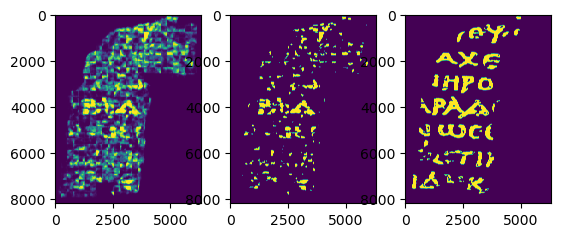

- epoch:3 -
Epoch: [3][0/125] Elapsed 0m 0s (remain 1m 47s) Loss: 0.2087(0.2087) 
Epoch: [3][124/125] Elapsed 0m 33s (remain 0m 0s) Loss: 0.1807(0.2073) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.2552(0.2552) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.1502(0.4389) 
	 th: 0.1, fbeta: 0.3170258800462952
	 th: 0.15, fbeta: 0.3391731838568511
	 th: 0.2, fbeta: 0.35760542860163635
	 th: 0.25, fbeta: 0.37408258046938364
	 th: 0.3, fbeta: 0.3899317847287625
	 th: 0.35, fbeta: 0.40433637064613726
	 th: 0.4, fbeta: 0.4189517583720997
	 th: 0.45, fbeta: 0.43327166451610344
	 th: 0.5, fbeta: 0.447254711824391
	 th: 0.55, fbeta: 0.45992118910552
	 th: 0.6, fbeta: 0.4712129885119296
	 th: 0.65, fbeta: 0.48258796264265763
	 th: 0.7, fbeta: 0.49302966770672707
	 th: 0.75, fbeta: 0.5001469213852362
	 th: 0.8, fbeta: 0.502542055322632
	 th: 0.85, fbeta: 0.4988550584154711
	 th: 0.9, fbeta: 0.47965001955718595
	 th: 0.95, fbeta: 0.43353583538507545
	 th: 1.0, fbeta: 0.0766718022618566
	

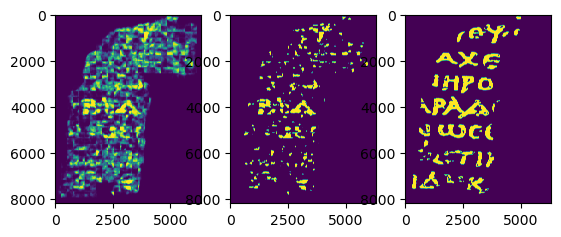

- epoch:4 -
Epoch: [4][0/125] Elapsed 0m 1s (remain 2m 5s) Loss: 0.2585(0.2585) 
Epoch: [4][124/125] Elapsed 0m 34s (remain 0m 0s) Loss: 0.2147(0.1935) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.2396(0.2396) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.1569(0.4262) 
	 th: 0.1, fbeta: 0.3301302221209891
	 th: 0.15, fbeta: 0.35607313413701835
	 th: 0.2, fbeta: 0.37719861297853713
	 th: 0.25, fbeta: 0.3944193617062215
	 th: 0.3, fbeta: 0.410264769368317
	 th: 0.35, fbeta: 0.4273360047320353
	 th: 0.4, fbeta: 0.44397035307606414
	 th: 0.45, fbeta: 0.4591413190905797
	 th: 0.5, fbeta: 0.47223746221601615
	 th: 0.55, fbeta: 0.4843664623623219
	 th: 0.6, fbeta: 0.49541031280284953
	 th: 0.65, fbeta: 0.5041425043669487
	 th: 0.7, fbeta: 0.5092105859246656
	 th: 0.75, fbeta: 0.5116550506097861
	 th: 0.8, fbeta: 0.5121633171594361
	 th: 0.85, fbeta: 0.5083690341106322
	 th: 0.9, fbeta: 0.4928034491914726
	 th: 0.95, fbeta: 0.4412686384592821
	 th: 1.0, fbeta: 0.08213796194290232
	

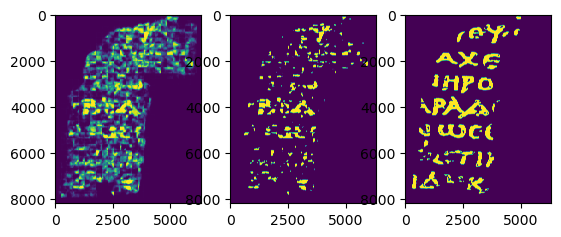

Epoch 4 - Save Best AUC: 0.8932. Model is saved.


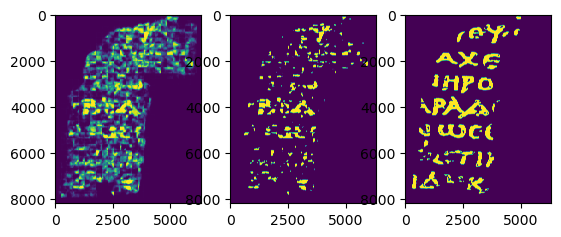

- epoch:5 -
Epoch: [5][0/125] Elapsed 0m 0s (remain 2m 3s) Loss: 0.1865(0.1865) 
Epoch: [5][124/125] Elapsed 0m 34s (remain 0m 0s) Loss: 0.2199(0.1843) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.2087(0.2087) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.1290(0.3977) 
	 th: 0.1, fbeta: 0.32919875097660295
	 th: 0.15, fbeta: 0.35363869304282525
	 th: 0.2, fbeta: 0.3753792942277059
	 th: 0.25, fbeta: 0.3935716108255429
	 th: 0.3, fbeta: 0.41009259389408503
	 th: 0.35, fbeta: 0.42460092028080376
	 th: 0.4, fbeta: 0.4381607150789348
	 th: 0.45, fbeta: 0.4510688017418283
	 th: 0.5, fbeta: 0.4630403753760192
	 th: 0.55, fbeta: 0.4725363738088893
	 th: 0.6, fbeta: 0.4806245778172541
	 th: 0.65, fbeta: 0.4859349397049024
	 th: 0.7, fbeta: 0.48447635997695926
	 th: 0.75, fbeta: 0.4808490875054567
	 th: 0.8, fbeta: 0.4685013303100331
	 th: 0.85, fbeta: 0.43761580283793766
	 th: 0.9, fbeta: 0.37725211451298263
	 th: 0.95, fbeta: 0.26576020370634873
	 th: 1.0, fbeta: 0.000170402233970

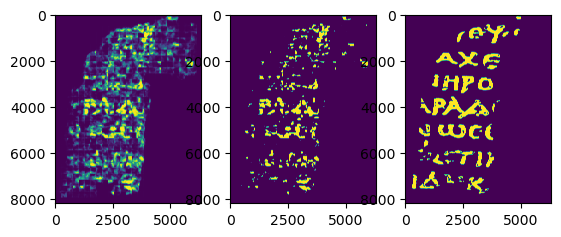

Epoch 12 - Save Best AUC: 0.8943. Model is saved.


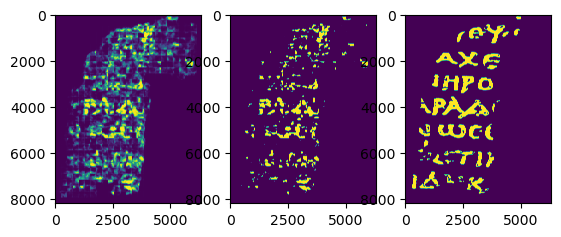

- epoch:13 -
Epoch: [13][0/125] Elapsed 0m 0s (remain 1m 52s) Loss: 0.1531(0.1531) 
Epoch: [13][124/125] Elapsed 0m 34s (remain 0m 0s) Loss: 0.1202(0.1745) 
EVAL: [0/31] Elapsed 0m 0s (remain 0m 7s) Loss: 0.1953(0.1953) 
EVAL: [30/31] Elapsed 0m 5s (remain 0m 0s) Loss: 0.1049(0.3861) 
	 th: 0.1, fbeta: 0.3609693224849789
	 th: 0.15, fbeta: 0.38933359305371185
	 th: 0.2, fbeta: 0.41278094323526077
	 th: 0.25, fbeta: 0.4327851941925846
	 th: 0.3, fbeta: 0.4503312040555701
	 th: 0.35, fbeta: 0.4645854766368872
	 th: 0.4, fbeta: 0.4756393507556564
	 th: 0.45, fbeta: 0.48486653500088456
	 th: 0.5, fbeta: 0.4918161301496889
	 th: 0.55, fbeta: 0.49754212414547005
	 th: 0.6, fbeta: 0.5024853547618789
	 th: 0.65, fbeta: 0.5056440632605775
	 th: 0.7, fbeta: 0.5075774379255433
	 th: 0.75, fbeta: 0.5057545548497013
	 th: 0.8, fbeta: 0.49574921938399497
	 th: 0.85, fbeta: 0.4699403851088761
	 th: 0.9, fbeta: 0.4243045599866314
	 th: 0.95, fbeta: 0.342602920795508
	 th: 1.0, fbeta: 0.031557865957559

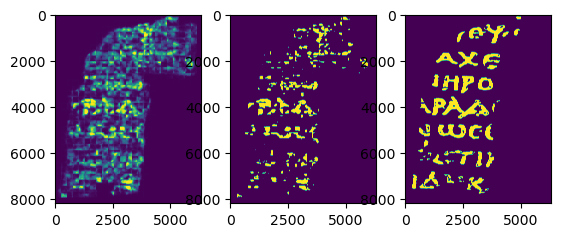

[fold2] slice ave score:0.5487(th=0.600000), auc=0.896197
[fold2] BEST Epoch 12 - Save Best Score:0.5333. Best loss:0.3941
[fold2] BEST AUC Epoch 12 - Save Best Score:0.8943. Best loss:0.3941
fold[0] BEST SCORE = 0.5653 thr=0.9 (epoch=14)
fold[1] BEST SCORE = 0.3968 thr=0.1 (epoch=7)
fold[2] BEST SCORE = 0.5333 thr=0.7 (epoch=12)


In [16]:
best_score_list, best_threshold_list, best_epoch_list = training_loop(CFG)
# if not CFG["DEBUG"]:
#     wandb.finish()

In [17]:
import yaml
with open(os.path.join(CFG["OUTPUT_DIR"], "Config.yaml"), "w") as f:
    yaml.dump(CFG, f)